# Lab-10: More on Choropleth, Folium Map, and Raster Data


Welcome to Lab 10!

In Lab 09, we introduced the foundation of choropleth and map, vector shapes, and how can we utilizes `GeoPandas` and `Shapely` pacakges to create and manipulate these vector shapes. In this lab, we will start from transit ethic analysis using choropleth, and then extending it to real street map. Then, we will look at another type of data that is very usefull in Spatial/Geographical Data Analysis: Raster Data

This Lab uses material from:

https://pygis.io/docs/c_features.html

https://appliedsciences.nasa.gov/sites/default/files/2020-11/UHI_Part1_v5.pdf

https://wiki.openstreetmap.org/wiki/Map_features

**NOTE: This Lab contains lots of plots and maps which might lead to insufficient memory problem when using ECF computers. Please clear preivous outputs if you encounter this problem**

**NOTE: The maps output in this notebook is be removed to reduce the file size, please re-run the code to see the map output**

In [3]:
!pip install mapclassify #helper package
import geopandas as gpd # import geopandas

# packages you already familiar
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
import warnings
warnings.filterwarnings('ignore')
import shapely.geometry

## Transportation Fairness
### Distance to the Nearest Subway Stations by Toronto Forward Sortation Area

In the previous lab, we conducted an analysis of COVID-19 confirmed cases using a choropleth map of US states. However, there are instances where we may not have the necessary dataset available to plot as values on a choropleth map, or the geographical division of the dataset may not align with the shapefile. To expand beyond the COVID-19 confirmed cases analysis from the previous lab, there are numerous other research problems that can benefit from utilizing choropleth maps to derive useful spatial distribution of data. In this section, we will focus on the 'Transportation Fairness' problem in Toronto.

Numerous studies have examined the issue of unfairness in public transportation development, such as subways, buses, and trains, based on factors such as race, population, and more. For instance, in the paper "Transportation Policy and the Underdevelopment of Black Communities" by Archer et al. [1], it is highlighted that the nation’s transportation infrastructure was constructed at the expense of Black communities. Several examples illustrate this:

- In Orlando, Florida, Interstate 4 was constructed to act as a barrier, separating Black communities on the west side of town from the central business district and white communities on the east side.
- In St. Paul, Minnesota, the construction of Interstate 94 led to the displacement of one-seventh of the city’s Black residents.
- In Pittsburgh, Pennsylvania, the construction of Interstate 579 resulted in the devastation of a Black community known as the Hill District. Upon the opening of Interstate 579, it severed the Hill District from Pittsburgh’s thriving downtown area and displaced thousands of Black residents.

However, numerous factors in the real world contribute to the 'Transportation Fairness' problem, and conducting research in this field requires a substantial amount of data and analysis to make valid statements. In this lab, we will examine a simplified example of these research problems: determining if there is unfairness in the distance to the closest TTC (Toronto Transit Commission) subway stations in Toronto based on Forward Sortation Area (the first three digits of the postal code).

[1]: https://ilr.law.uiowa.edu/print/volume-106-issue-5/transportation-policy-and-the-underdevelopment-of-black-communities#:~:text=The%20nation's%20transportation%20infrastructure%20was,take%20advantage%20of%20society's%20opportunities

### Census Tract ShapeFiles

 let's start by downloading the shapefile for Toronto's Forward Sortation Area

In [ ]:
!wget https://www12.statcan.gc.ca/census-recensement/2011/geo/bound-limit/files-fichiers/2016/lfsa000a16a_e.zip
!os make lfsa000a16a_e
!unzip lfsa000a16a_e.zip -d lfsa000a16a_e

--2024-03-22 20:08:58--  https://www12.statcan.gc.ca/census-recensement/2011/geo/bound-limit/files-fichiers/2016/lfsa000a16a_e.zip
Resolving www12.statcan.gc.ca (www12.statcan.gc.ca)... 167.44.105.15
Connecting to www12.statcan.gc.ca (www12.statcan.gc.ca)|167.44.105.15|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 15662579 (15M) [application/x-zip-compressed]
Saving to: ‘lfsa000a16a_e.zip’

lfsa000a16a_e.zip   100%[===================>]  14.94M   328KB/s    in 36s     

2024-03-22 20:09:35 (427 KB/s) - ‘lfsa000a16a_e.zip’ saved [15662579/15662579]

/bin/bash: line 1: os: command not found
Archive:  lfsa000a16a_e.zip
  inflating: lfsa000a16a_e/lfsa000a16a_e.dbf  
  inflating: lfsa000a16a_e/lfsa000a16a_e.prj  
  inflating: lfsa000a16a_e/lfsa000a16a_e.shp  
  inflating: lfsa000a16a_e/lfsa000a16a_e.shx  
  inflating: lfsa000a16a_e/forward_sortation_area.html  
  inflating: lfsa000a16a_e/92-179-g2016001-eng.pdf  


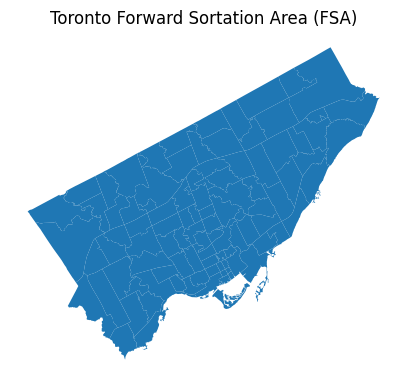

In [5]:
toronto_FSA = gpd.read_file('lfsa000a16a_e')
# 'CFSAUID' start with m
toronto_FSA = toronto_FSA[toronto_FSA['CFSAUID'].str.startswith('M')]
toronto_FSA.plot(figsize=(5, 5), legend=True)
plt.title('Toronto Forward Sortation Area (FSA)')
plt.axis('off')
plt.show()

In [6]:
toronto_FSA.head()

,CFSAUID,PRUID,PRNAME,geometry
768,M1P,35,Ontario,"POLYGON ((7233594.731 942118.174, 7233584.157 ..."
769,M1R,35,Ontario,"MULTIPOLYGON (((7231166.760 939882.914, 723135..."
770,M6C,35,Ontario,"MULTIPOLYGON (((7220196.740 930982.386, 722018..."
771,M6E,35,Ontario,"POLYGON ((7219191.197 933171.903, 7219193.997 ..."
772,M6G,35,Ontario,"POLYGON ((7221255.774 931367.994, 7221267.914 ..."


This shapefile contains vector shapes of each FSA, with a set of IDs that uniquely define each FSA. We will be using the `CFSAUID` for our analysis.

In [7]:
toronto_FSA = toronto_FSA[['CFSAUID', 'geometry']]

We also need to verify the CRS of this shapefile

In [ ]:
toronto_FSA.crs

<Projected CRS: PROJCS["PCS_Lambert_Conformal_Conic",GEOGCS["NAD83 ...>
Name: PCS_Lambert_Conformal_Conic
Axis Info [cartesian]:
- [east]: Easting (metre)
- [north]: Northing (metre)
Area of Use:
- undefined
Coordinate Operation:
- name: unnamed
- method: Lambert Conic Conformal (2SP)
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

The CRS for this ShapeFile is PCS_Lambert_Conformal_Conic, which is a custom-defined projection. Although not ideal, we can proceed with it for now.

Next, to analyze the distance between each census tract and its closest transit stations, we require the coordinate information of each TTC station. For the sake of simplicity in this lab, we will focus solely on TTC Subway Stations as transit stations. You can search for these coordinate information on the Internet. However, a more convenient approach is to obtain this information using `OpenStreetMap`.



### OpenStreetMap

OpenStreetMap (OSM) is a collaborative project launched in 2004 with the goal of creating a free and editable map of the world. Often referred to as the "Wikipedia of maps," OSM has become a comprehensive mapping resource over the years. Unlike proprietary mapping services like Google Maps, OSM data is open and can be freely used, edited, and distributed by anyone.

In addition to the 'Map' feature of OSM, the OSM database contains many other geological features, such as types of buildings, medical rescue locations, roads, public transit, shops, waterways, and more. You can find the complete list of features available in OpenStreetMap [here](https://wiki.openstreetmap.org/wiki/Map_features).

OpenStreetMap data is extensively used in various applications and services, including navigation apps, Geographic Information Systems (GIS) software, urban planning tools, humanitarian projects, and more. The project promotes open access to geographic information and empowers communities to create and maintain accurate maps tailored to their specific needs.

Fortunately, OpenStreetMap provides an API for users to extract data from its database using Python. There are several packages that utilize this API, and in this lab, we will introduce one of them: `osmnx`. Each geo-information within OSM contains a set of keys to define its belong groups. You can think each Keys as a categorial variable. For example, all TTC geo-information belong the 'TTC' value of 'network' Key.

In [ ]:
!pip install osmnx==1.9.1
import osmnx as ox #import the osmx packag

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.3/104.3 kB 2.6 MB/s eta 0:00:00


In [ ]:
place = "City of Toronto, Ontario, Canada" # define the place for data extraction
tags = {'network':'TTC'} # define the Keys, and value of Keys
gdf_TTC = ox.features.features_from_place(place, tags).reset_index() # extract the data
print(gdf_TTC.shape) # print the shape of the data
gdf_TTC.head() # print the first 5 rows of the data

(8911, 130)


,element_type,osmid,highway,geometry,note,fixme,direction,tactile_paving,source,is_in:city,...,area,park_ride,building:levels,location,underground,source:geometry,construction:amenity,construction:bus,construction:public_transport,payment:cash
0,node,25991312,NaN,POINT (-79.41143 43.66562),NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,node,25991314,NaN,POINT (-79.39027 43.67019),NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,node,25991463,NaN,POINT (-79.45297 43.65703),NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,node,26240971,NaN,POINT (-79.38827 43.65482),NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,node,26240972,NaN,POINT (-79.38102 43.65654),NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


**Problem 1**

When specifying the network as TTC, it encompasses all geo-information related to the TTC as entities. This includes the locations of bus routes, bus stations, locations of garages, and more, totaling more than 8000 entities. Since different types of geo-information contain different sets of features, and the columns in this dataframe contains features from all types of geo-information. missing features will be displayed as NaN. We can elimnate this NaN by only selecting features that exist in all types of locations. for example, name, element type, geometry.

**Problem 2**

However, for our purposes, we are specifically interested in TTC subway stations, of which there are only around 70 stations. Therefore, we need to find an available feature that allows us to filter the geo-information to only include TTC subway stations.

By examine the list of columns aviabile in this dataset, column `subway` catches our eyes.

If the geo-information pertains to a 'subway', then the 'subway' column will be labeled 'yes'; otherwise, it will be 'NaN'. With this understanding, we can utilize pandas operations to extract rows where the 'subway' column is equal to 'yes', effectively filtering out only the TTC subway stations from the dataset.

In [ ]:
gdf_subway = gdf_TTC[gdf_TTC['subway'] == 'yes'] # filter the subway data
gdf_subway.shape

(195, 130)

Another approach is to use more than one tag to retrieve entities from the OSM database. However, including multiple tags functions as a 'union' operation in the `osmnx` package. (all rows with network TTC + all rows with subway 'yes'). Consequently, we would need to manually remove rows that have 'null' values in either of the columns we retrieved. This ensures that we're left with the desired subset of data containing only the TTC subway stations.

In [ ]:
place = "City of Toronto, Ontario, Canada" # define the place for data extraction
tags = {'network':'TTC','subway':'yes'} # define the feature, and value of feature
gdf_subway_from_query = ox.features.features_from_place(place, tags).reset_index() # extract the data
gdf_subway_from_query = gdf_subway_from_query[pd.notnull(gdf_subway_from_query["network"]) & pd.notnull(gdf_subway_from_query["subway"])] # remove the null values
gdf_subway_from_query.shape

(195, 137)

The presence of 7 extra columns can be attributed to the fact that certain features might not exist in all geographic information tagged with 'network':'TTC'. However, they could still exist in geographic information tagged with 'subway':'yes'.

Despite filtering for TTC and subway, there are still 125 rows related to the TTC subway, which is more than the expected count of 70.

In [ ]:
gdf_subway.geometry.type.unique() # check the geometry type of the data

array(['Point', 'LineString', 'Polygon'], dtype=object)

We only want to keeps point (locations), instead of Linestring (might be route), and Polygon (some other areas)

In [ ]:
gdf_subway_station = gdf_subway[gdf_subway.geometry.type == 'Point'][['name', 'geometry']] # filter the data and only keep the name and geometry
print(gdf_subway_station.shape) # print the shape of the data
gdf_subway_station.head() # print the first 5 rows of the data

(98, 2)


,name,geometry
0,Bathurst,POINT (-79.41143 43.66562)
1,Bay,POINT (-79.39027 43.67019)
2,Dundas West,POINT (-79.45297 43.65703)
3,St. Patrick,POINT (-79.38827 43.65482)
4,Dundas,POINT (-79.38102 43.65654)


In [ ]:
#drop row with duplicate name
gdf_subway_station = gdf_subway_station.drop_duplicates(subset='name').reset_index(drop=True)
gdf_subway_station

,name,geometry
0,Bathurst,POINT (-79.41143 43.66562)
1,Bay,POINT (-79.39027 43.67019)
2,Dundas West,POINT (-79.45297 43.65703)
3,St. Patrick,POINT (-79.38827 43.65482)
4,Dundas,POINT (-79.38102 43.65654)
...,...,...
62,Dufferin,POINT (-79.43539 43.66026)
63,Ossington,POINT (-79.42611 43.66238)
64,Warden,POINT (-79.27904 43.71112)
65,Victoria Park,POINT (-79.28880 43.69487)


The organization of OSM data can be a bit unclear, since its user-created data, especially when searching for less common information such as subway stations within the TTC. However, one advantage is that there are many keys associated with each location information. By creating combinations of Key's values, we can effectively filter out unwanted information and create a targeted query to extract the desired data. Crafting a well-designed query is crucial when dealing with such ambiguously organized data, as it helps in efficiently retrieving the relevant information we need.

Before plotting them within the FSA shapefile, we still need to make sure they under the same CRS.

In [ ]:
gdf_subway_station.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

Recall that FSA shapefile CRS is PCS_Lambert_Conformal_Conic, we want to convert it to this more commonly used CRS: EPSG:4326, which WGS84

In [8]:
print('CRS of toronto_FSA:', toronto_FSA.crs)
toronto_FSA.to_crs(epsg=4326, inplace=True)
print('CRS of toronto_FSA:', toronto_FSA.crs)

CRS of toronto_FSA: PROJCS["PCS_Lambert_Conformal_Conic",GEOGCS["NAD83",DATUM["North_American_Datum_1983",SPHEROID["GRS 1980",6378137,298.257222101,AUTHORITY["EPSG","7019"]],AUTHORITY["EPSG","6269"]],PRIMEM["Greenwich",0],UNIT["Degree",0.0174532925199433]],PROJECTION["Lambert_Conformal_Conic_2SP"],PARAMETER["latitude_of_origin",63.390675],PARAMETER["central_meridian",-91.8666666666667],PARAMETER["standard_parallel_1",49],PARAMETER["standard_parallel_2",77],PARAMETER["false_easting",6200000],PARAMETER["false_northing",3000000],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH]]
CRS of toronto_FSA: EPSG:4326


In [109]:
#rename the columns
toronto_FSA.columns = ['name', 'geometry']
#create a new column called property_type to help us distinguish the data
toronto_FSA['property_type'] = 'FSA'
gdf_subway_station['property_type'] = 'subway_station'
#concatenate the data
gdf_all = pd.concat([toronto_FSA, gdf_subway_station  ], axis=0, ignore_index=True)
gdf_all

,name,geometry,property_type,proerpty_type
0,M9R,"POLYGON ((-79.56131 43.67478, -79.56249 43.674...",FSA,NaN
1,M9V,"POLYGON ((-79.57759 43.76205, -79.57829 43.761...",FSA,NaN
2,M9W,"POLYGON ((-79.53885 43.72937, -79.53884 43.728...",FSA,NaN
3,M1P,"POLYGON ((-79.24704 43.75374, -79.24720 43.753...",FSA,NaN
4,M1R,"MULTIPOLYGON (((-79.28125 43.73867, -79.27985 ...",FSA,NaN
...,...,...,...,...
158,Dufferin,POINT (-79.43539 43.66026),subway_station,subway_station
159,Ossington,POINT (-79.42611 43.66238),subway_station,subway_station
160,Warden,POINT (-79.27904 43.71112),subway_station,subway_station
161,Victoria Park,POINT (-79.28880 43.69487),subway_station,subway_station


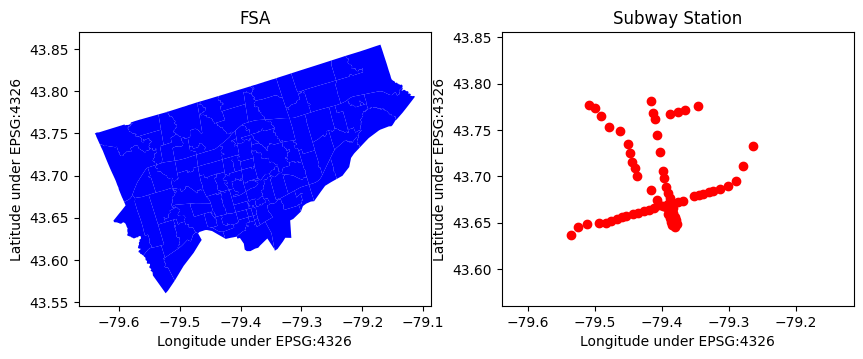

In [110]:
fig, ax = plt.subplots(1,2, figsize=(10, 5))
gdf_all[gdf_all['property_type'] == 'FSA'].plot(figsize=(5, 5), legend=True, color='blue', ax=ax[0])
gdf_all[gdf_all['property_type'] == 'subway_station'].plot(figsize=(5, 5), legend=True, color='red', ax=ax[1])
ax[0].set_title('FSA')
ax[1].set_title('Subway Station')
ax[0].set_xlabel('Longitude under EPSG:4326')
ax[0].set_ylabel('Latitude under EPSG:4326')
ax[1].set_xlabel('Longitude under EPSG:4326')
ax[1].set_ylabel('Latitude under EPSG:4326')
#allow both plots have the same boundary
ax[1].set_xlim(gdf_all[gdf_all['property_type'] == 'FSA'].total_bounds[0], gdf_all[gdf_all['property_type'] == 'FSA'].total_bounds[2])
ax[1].set_ylim(gdf_all[gdf_all['property_type'] == 'FSA'].total_bounds[1], gdf_all[gdf_all['property_type'] == 'FSA'].total_bounds[3])
plt.show()

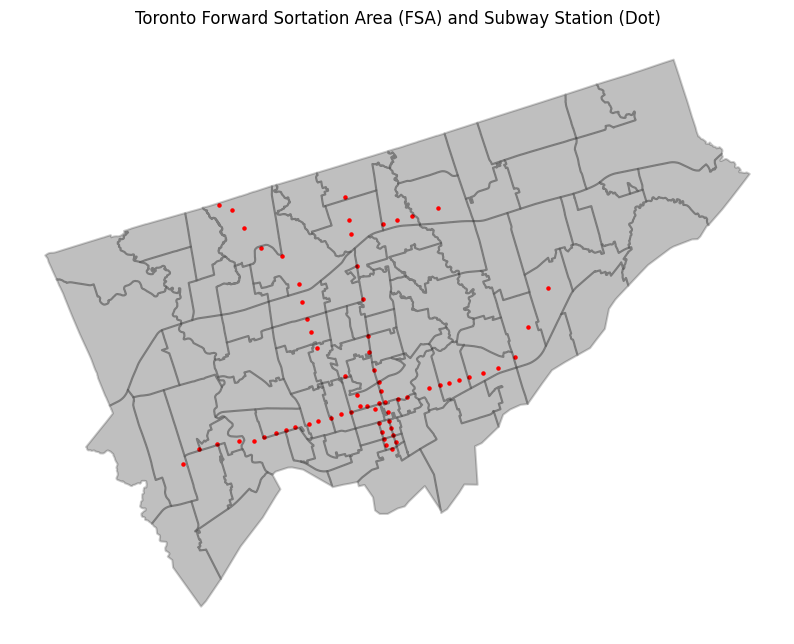

In [111]:
# plot the FSA shapefile and Subway Station point in the same plot
gdf_all[gdf_all['property_type'] == 'FSA'].plot(figsize=(10, 10), legend=True, color = 'grey',alpha=0.5)
gdf_all[gdf_all['property_type'] == 'subway_station'].plot(figsize=(10, 10), legend=True,
                                                           color='red', ax=plt.gca(),alpha=1, markersize=5)
# boundary of the shapefile
gdf_all[gdf_all['property_type'] == 'FSA'].boundary.plot(figsize=(10, 10), color = 'black', ax=plt.gca(),alpha=0.2)

plt.title('Toronto Forward Sortation Area (FSA) and Subway Station (Dot)')
plt.axis('off')
plt.show()

## Calculating Distance using Geometric Distance of Vector Shapes


Indeed, there are various methods to calculate distances between geographical features. One straightforward approach is to compute the distance between each vector shape representing the location (e.g., TTC subway station) and the vector shape representing the FSA. This method involves measuring the straight-line distance between each FSA polygon and the coordinates of the TTC subway stations. While this approach provides a simple estimation of distance, it may not accurately reflect the actual travel distance along road networks.

When calculating the distance between a point and a polygon, one crucial consideration is determining the representation of the polygon as a point. In this context, the choice of representation can significantly impact the results. For example, using a boundary point of the polygon is a common approach. However, there are multiple boundary points to choose from, leading to various possibilities.

In this lab, we will use the centroid of each polygon as its representation point. The centroid serves as a central point within the polygon and is commonly used for calculations involving polygonal features. Using centroids provides a balanced representation of the polygons and simplifies the distance calculations between points and polygons.

In [ ]:
def get_centroid(geom):
    if geom.geom_type == 'Polygon' or geom.geom_type == 'MultiPolygon':
        return geom.centroid
    else:
        return geom

gdf_all_with_centroid = gdf_all.copy() #to easier understand the code
gdf_all_with_centroid['centroid'] = gdf_all_with_centroid['geometry'].apply(get_centroid)
gdf_all_with_centroid.head()

,name,geometry,proerpty_type,centroid
0,M9R,"POLYGON ((-79.56131 43.67478, -79.56249 43.674...",FSA,POINT (-79.55799 43.68778)
1,M9V,"POLYGON ((-79.57759 43.76205, -79.57829 43.761...",FSA,POINT (-79.59433 43.74274)
2,M9W,"POLYGON ((-79.53885 43.72937, -79.53884 43.728...",FSA,POINT (-79.58416 43.70983)
3,M1P,"POLYGON ((-79.24704 43.75374, -79.24720 43.753...",FSA,POINT (-79.27000 43.76213)
4,M1R,"MULTIPOLYGON (((-79.28125 43.73867, -79.27985 ...",FSA,POINT (-79.29717 43.74945)


 Once we have the centroids of each FSA polygon and the coordinates of each subway station, we can calculate the distance matrix between all the FSA centroids and each subway station. This distance matrix will provide us with the distances from each FSA centroid to each subway station, facilitating further analysis and visualization.

In [ ]:
fsa_centroid = gdf_all_with_centroid[gdf_all_with_centroid['property_type'] == 'FSA'][['name', 'centroid']]
subway_station_centroid = gdf_all_with_centroid[gdf_all_with_centroid['property_type'] == 'subway_station'][['name', 'centroid']]

# calculate the distance between each FSA and subway station
def get_distance_matrix(fsa_centroid, subway_station_centroid) -> pd.DataFrame:
    '''
    this function is used to calculate the distance matrix between each FSA and subway station

    fsa_centroid: dataframe with the centroid of FSA
    subway_station_centroid: dataframe with  the centroid of subway station

    return: a dataframe with the distance between each FSA and subway station
    '''
    distance_matrix = np.zeros((fsa_centroid.shape[0], subway_station_centroid.shape[0]))
    for i in range(fsa_centroid.shape[0]):
        for j in range(subway_station_centroid.shape[0]):
            distance_matrix[i, j] = fsa_centroid.iloc[i]['centroid'].distance(subway_station_centroid.iloc[j]['centroid'])
    distance_matrix = pd.DataFrame(distance_matrix, index=fsa_centroid['name'].to_list(), columns=subway_station_centroid['name'])
    return distance_matrix

distance_matrix = get_distance_matrix(fsa_centroid, subway_station_centroid)
distance_matrix

name,Bathurst,Bay,Dundas West,St. Patrick,Dundas,Main Street,Pape,Coxwell,Woodbine,St. George,...,Pioneer Village,York University,Royal York,Islington,Lansdowne,Dufferin,Ossington,Warden,Victoria Park,Chester
M9R,0.148225,0.168639,0.109424,0.172885,0.179702,0.256405,0.213418,0.234920,0.245086,0.160314,...,0.101581,0.104264,0.061219,0.053866,0.118714,0.125650,0.134298,0.279920,0.269285,0.205696
M9V,0.198495,0.216575,0.165311,0.224029,0.230067,0.297629,0.257421,0.277466,0.286988,0.209127,...,0.091693,0.099800,0.125838,0.119663,0.173086,0.179067,0.186424,0.316869,0.309261,0.250273
M9W,0.178302,0.197904,0.141415,0.203466,0.210014,0.283340,0.241318,0.262316,0.272258,0.189883,...,0.100557,0.106248,0.095444,0.087642,0.150198,0.156815,0.165017,0.305122,0.295744,0.233794
M1P,0.171223,0.151393,0.211014,0.159705,0.153223,0.079632,0.111176,0.094243,0.086957,0.159307,...,0.239695,0.229926,0.266852,0.280312,0.201171,0.194245,0.185262,0.051810,0.069842,0.117683
M1R,0.141712,0.122272,0.181153,0.131357,0.125156,0.060573,0.084321,0.070143,0.064885,0.129997,...,0.213840,0.203944,0.236866,0.250326,0.171364,0.164494,0.155586,0.042396,0.055216,0.090197
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
M6M,0.079107,0.097953,0.049036,0.104608,0.110777,0.183788,0.141295,0.162501,0.172563,0.090133,...,0.086383,0.081535,0.052579,0.062597,0.054936,0.060193,0.067061,0.206986,0.196516,0.133717
M6N,0.073063,0.093774,0.035593,0.097686,0.104487,0.182927,0.139320,0.161138,0.171450,0.085317,...,0.105400,0.100813,0.038012,0.050257,0.043964,0.050619,0.059099,0.208131,0.196196,0.131477
M6P,0.052292,0.073845,0.010960,0.075368,0.082507,0.164395,0.120325,0.142389,0.152808,0.065117,...,0.125298,0.119503,0.049353,0.063161,0.020690,0.028058,0.037392,0.191286,0.178043,0.112375
M5P,0.030811,0.034361,0.056498,0.048118,0.050783,0.111124,0.069751,0.090192,0.100051,0.031109,...,0.125865,0.116785,0.109972,0.123418,0.048072,0.042806,0.036665,0.134230,0.123678,0.062649


In [ ]:
distance_matrix.shape # rows are FSA, columns are subway station

(96, 67)

We can utilize a heatmap to visualize the distance matrix between FSA centroids and TTC subway stations. However, similar to the issue encountered in the previous lab with time series plots, the heatmap may suffer from displaying too many samples, leading to difficulty in interpretation and a loss of spatial information.

Furthermore, since FSAs are represented by geographic codes rather than easily interpretable names, it can be challenging to understand them solely by their codes.

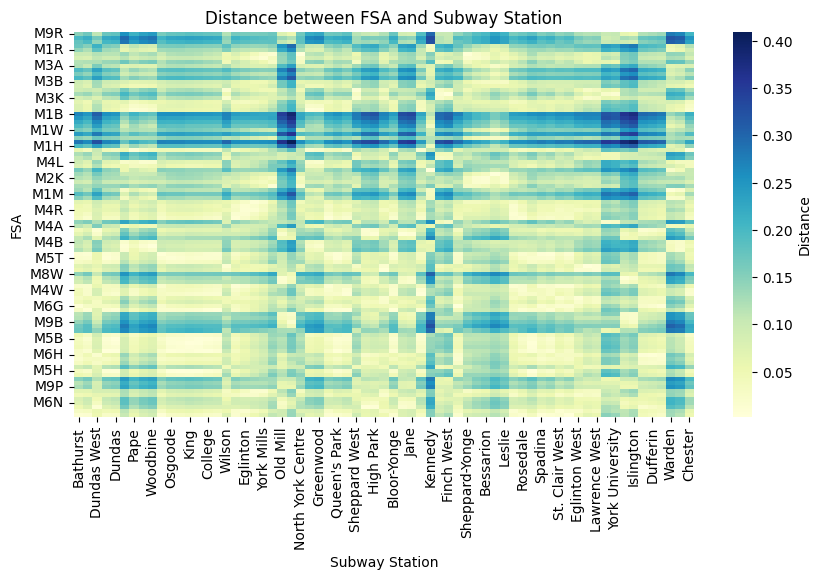

In [ ]:
import seaborn as sns
plt.figure(figsize=(10, 5))
sns.heatmap(distance_matrix, cmap='YlGnBu', cbar_kws={'label': 'Distance'})
plt.title('Distance between FSA and Subway Station')
plt.xlabel('Subway Station')
plt.ylabel('FSA')
plt.show()

We can using this distance matrix to find the distance between each FSA to its closest station

In [ ]:
# create a new pandas series to store the nearest distance
smallest_distance = distance_matrix.min(axis=1)
# assign the name of the series for future merging
smallest_distance.name = 'distance_to_nearest_subway_station'
# obtain all row that is a foward sortation area
gdf_FSA = gdf_all[gdf_all_with_centroid['property_type'] == 'FSA']
# merge the distance series with the FSA shape data
gdf_smallest_distance = gdf_FSA.merge(smallest_distance, left_on='name', right_index=True).rename(columns={0: 'distance_to_nearest_subway_station'})
gdf_smallest_distance.head()

/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])


,name,geometry,proerpty_type,distance_to_nearest_subway_station
0,M9R,"POLYGON ((-79.56131 43.67478, -79.56249 43.674...",FSA,0.053866
1,M9V,"POLYGON ((-79.57759 43.76205, -79.57829 43.761...",FSA,0.091693
2,M9W,"POLYGON ((-79.53885 43.72937, -79.53884 43.728...",FSA,0.087130
3,M1P,"POLYGON ((-79.24704 43.75374, -79.24720 43.753...",FSA,0.030347
4,M1R,"MULTIPOLYGON (((-79.28125 43.73867, -79.27985 ...",FSA,0.037524


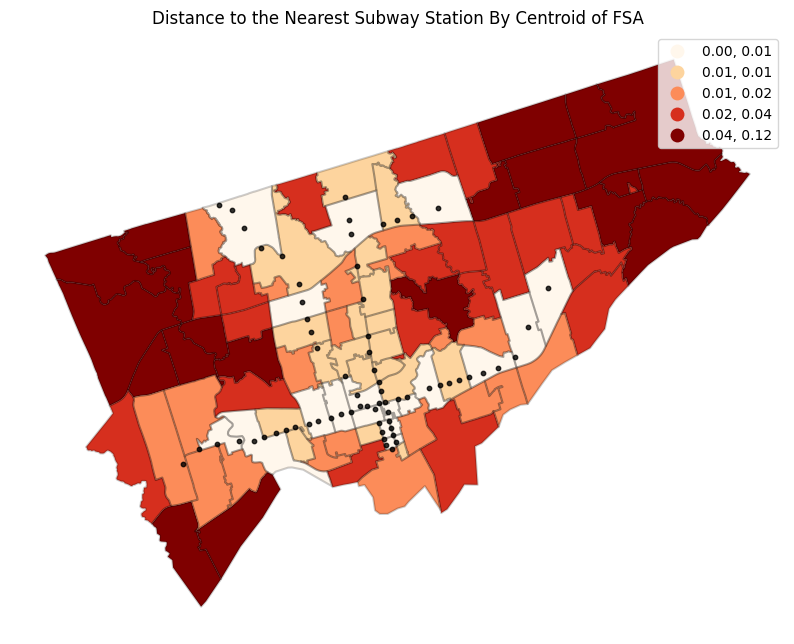

In [ ]:
gdf_smallest_distance.plot(column='distance_to_nearest_subway_station', legend=True, scheme='quantiles',
              cmap='OrRd', figsize=(10, 10))
gdf_smallest_distance.boundary.plot(figsize=(10, 10), color = 'black', ax=plt.gca(),alpha=0.2)
# add subway station
gdf_all[gdf_all['property_type'] == 'subway_station'].plot(ax=plt.gca(), color='black', alpha=0.8, markersize=10)
plt.title('Distance to the Nearest Subway Station By Centroid of FSA')
plt.axis('off')
plt.show()

## Folium Map

![](https://python-visualization.github.io/folium/latest/_images/folium_logo.png)

Folium makes it easy to visualize data that’s been manipulated in Python on an interactive map. It enables both the binding of data to a map for choropleth visualizations as well as passing rich vector/raster/HTML visualizations as markers on the map.

### Basic

In [ ]:
# import the package
import folium as fm

You can using `fm.Map()` function to initial a map

In [ ]:

# create a map object
m = fm.Map(location=[43.7, -79.4], zoom_start=12) # define toronto as the center of the map, you can play around with different zoom_start to see what is the output
# if using ipynb, you can display the map directly in the notebook
m
#or you can save the map as a html file
#m.save('map.html')

In [ ]:
# you can disable the zoom features by setting zoom_control=False, scrollWheelZoom=False
m = fm.Map(location=[43.7, -79.4], zoom_start=12
           ,zoom_control=False, scrollWheelZoom=False)

m

### Tileset

A tileset refers to the visual appearance and style of the map. Folium allows you to customize the appearance of your map by specifying different tilesets. Tilesets determine the colors, textures, and other visual aspects of the map.

The default tileset for `Folium` is OpenStreetMap, you can use `tiles=` parameter to change the tileset

In [ ]:
cartodb_positron = fm.Map(location=[43.7, -79.4], zoom_start=12,
                          tiles='cartodb positron', zoom_control=False, scrollWheelZoom=False)
cartodb_positron

Or you can overlay a new tileset on the existing one using `TileLayer` function

In [ ]:
# or using .TileLayer() to add the tile layer
dark_matter = fm.Map(location=[43.7, -79.4], zoom_start=12, scrollWheelZoom=False) # default is openstreetmap
fm.TileLayer('cartodb dark_matter').add_to(dark_matter) # add the dark matter tile layer
dark_matter

### Layers

The cornerstone of the Folium Map and many modern GIS software systems is their Layers System. Each layer can represent unique features of the dataset. By overlaying multiple layers together on a single map, we can create a spatial comparison between all features. Let's using the distance to the nearest TTC subway station choropleth we just created as an example.

#### Layer 0: Creating a Blank Map

In [ ]:
distance_nearest_ttc_map = fm.Map(location=[43.7, -79.4], zoom_start=12,
                                  scrollWheelZoom=False, tiles=None, control_scale=True)
distance_nearest_ttc_map

We created a blank map (distance_nearest_ttc_map ) centered at a specific latitude and longitude, with an initial zoom level of 12.

#### Layer 1: OpenStreetMap Tile Set

Different types of layers can be created using different Folium functions. To create a Tile Set Layer, we can use `.TileLayer()`.

For every layer you create, make sure to use the `add_to()` function to add the layer to your map.

Of course, you can combine Layer 0 and Layer 1 into a single step

In [ ]:
fm.TileLayer('openstreetmap').add_to(distance_nearest_ttc_map)
distance_nearest_ttc_map

#### Layer 2: Distance to the Nearest Subway Station Choropleth

We can also added the choropleth we just created using `GeoPandas` into the `folium` map, to do this, we need to convert the `GeoDataFrame` into `Geo-json` format

In [ ]:
gdf_smallest_distance.head()

,name,geometry,proerpty_type,distance_to_nearest_subway_station
0,M9R,"POLYGON ((-79.56131 43.67478, -79.56249 43.674...",FSA,0.053866
1,M9V,"POLYGON ((-79.57759 43.76205, -79.57829 43.761...",FSA,0.091693
2,M9W,"POLYGON ((-79.53885 43.72937, -79.53884 43.728...",FSA,0.087130
3,M1P,"POLYGON ((-79.24704 43.75374, -79.24720 43.753...",FSA,0.030347
4,M1R,"MULTIPOLYGON (((-79.28125 43.73867, -79.27985 ...",FSA,0.037524


we can use `to_json()` function to convert a `GeoDataframe` to geo-json format

In [ ]:
FSA_json = gdf_smallest_distance.to_json()

In [ ]:
#get the quantile
quantile = gdf_smallest_distance['distance_to_nearest_subway_station'].quantile([0, 0.25, 0.5, 0.75, 1]).to_list()
quantile

[0.002170376568812657,
 0.008055313398946457,
 0.01808286652921622,
 0.037922241474828464,
 0.12182264273237856]

In [ ]:
fm.Choropleth( # create a choropleth layer
    geo_data=FSA_json, # feed in the json data for vector shape
    name='Distance to the Nearest Subway Station', # name of the layer
    data=gdf_smallest_distance, # feed in the dataframe for feature properties
    columns=['name', 'distance_to_nearest_subway_station'], # columns to use from the dataframe
    key_on='feature.properties.name', # key to match the json data and dataframe
    fill_color='OrRd', # color for the choropleth
    fill_opacity=0.4, # opacity of the fill color
    line_opacity=0.2, # opacity of the boundary line
    bins = quantile, # bins to classify the data
    legend_name='Distance to the Nearest Subway Station' # name of the legend
).add_to(distance_nearest_ttc_map) # add the layer to the map
distance_nearest_ttc_map # display the map

#### Layer 3: TTC Stations Layers

In [ ]:
# layer 3: add the subway station point
station = fm.FeatureGroup(name="TTC Station", control=True).add_to(distance_nearest_ttc_map) #feature group will make all the layer in this group can be controlled as a single layer

for i, row in subway_station_centroid.iterrows():
    fm.Marker([row['centroid'].y, row['centroid'].x], # define the location of the marker
              popup=row['name'], # define the popup message
              icon=fm.Icon(color='black', icon='train', prefix='fa') # define the icon of the marker
             ).add_to(station) # add the marker to the feature group

distance_nearest_ttc_map

#### Layer 4: Median Income Circle

We can also use other types of layer to represent different features, for example median income. We extract median income per FSA from 2016 census data

In [ ]:
# get prencentage of visual minority
census_data = pd.read_csv('https://raw.githubusercontent.com/MIE223-2024/course-datasets/main/2016_census.csv').iloc[:, 1:]
census_data.columns = ['name', 'median_income', 'population','visual_minority']
census_data['prec_visual_minority'] = census_data['visual_minority'] / census_data['population']
census_data_with_centroid = fsa_centroid.merge(census_data, on='name')
# min max scale the median income
census_data_with_centroid['median_income'] = (census_data_with_centroid['median_income'] -
                                              census_data_with_centroid['median_income'].min()) / (census_data_with_centroid['median_income'].max() - census_data_with_centroid['median_income'].min())
census_data_with_centroid.head()

,name,centroid,median_income,population,visual_minority,prec_visual_minority
0,M9R,POINT (-79.55799 43.68778),0.206625,33743.0,18375.0,0.544557
1,M9V,POINT (-79.59433 43.74274),0.080089,55959.0,45600.0,0.814882
2,M9W,POINT (-79.58416 43.70983),0.158604,40684.0,28040.0,0.689214
3,M1P,POINT (-79.27000 43.76213),0.129778,45571.0,33615.0,0.737640
4,M1R,POINT (-79.29717 43.74945),0.162410,29858.0,16840.0,0.564003


We can using the radius of the circle on each centroid of FSA to represent the ratio of median income, smaller circle indicating lower median income, larger circle indicating higher median income

In [ ]:
#circle marker
median_income = fm.FeatureGroup(name="Median Income", control=True).add_to(distance_nearest_ttc_map)

for index, row in census_data_with_centroid.iterrows():
    centroid = [row['centroid'].y, row['centroid'].x]
    fm.CircleMarker(centroid, radius=row['median_income']*20, color='blue',
     fill=True, fill_color='blue').add_to(median_income)

distance_nearest_ttc_map

#### Layer Controller

You can enhance the map's functionality by implementing a layer controller. This controller allows users to switch between different tile sets and toggle layers on and off, providing greater flexibility and customization options for their viewing experience.

In [ ]:
# layer control
fm.TileLayer('cartodb dark_matter',show=False).add_to(distance_nearest_ttc_map) # add the dark matter tile layer, show=False means the layer is not shown by default
fm.TileLayer('cartodb positron',show=False).add_to(distance_nearest_ttc_map) # add the positron tile layer

fm.LayerControl().add_to(distance_nearest_ttc_map) # add the layer control
distance_nearest_ttc_map


We can also show the relationship of median income and distance to the closest subway stations in a scatterplot

In [ ]:
distance_vs_income = census_data_with_centroid.merge(gdf_smallest_distance,
                                                     on='name')[['median_income',
                                                                 'distance_to_nearest_subway_station']]
#normalize each column
distance_vs_income['median_income'] = (distance_vs_income['median_income'] - distance_vs_income['median_income'].min()) / (distance_vs_income['median_income'].max() - distance_vs_income['median_income'].min())
distance_vs_income['distance_to_nearest_subway_station'] = (distance_vs_income['distance_to_nearest_subway_station'] - distance_vs_income['distance_to_nearest_subway_station'].min()) / (distance_vs_income['distance_to_nearest_subway_station'].max() - distance_vs_income['distance_to_nearest_subway_station'].min())
distance_vs_income.head()

,median_income,distance_to_nearest_subway_station
0,0.206625,0.432051
1,0.080089,0.748188
2,0.158604,0.710053
3,0.129778,0.235492
4,0.162410,0.295473


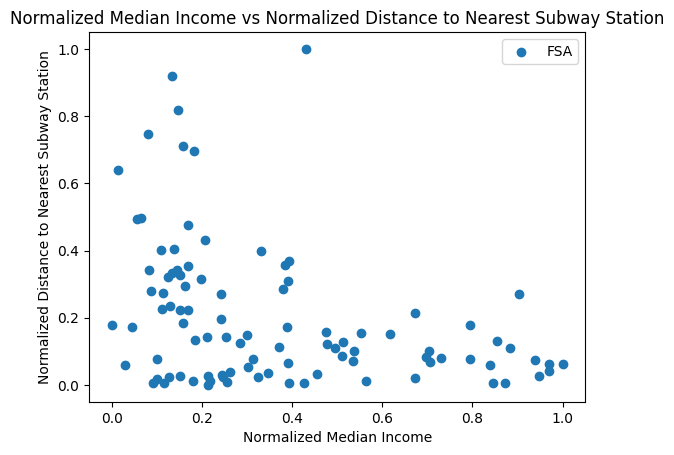

In [ ]:
plt.scatter(distance_vs_income['median_income'], distance_vs_income['distance_to_nearest_subway_station'])
plt.xlabel('Normalized Median Income')
plt.ylabel('Normalized Distance to Nearest Subway Station')
plt.legend(['FSA'])
plt.title('Normalized Median Income vs Normalized Distance to Nearest Subway Station')
plt.show()

In [ ]:
# correlation
distance_vs_income.corr()

,median_income,distance_to_nearest_subway_station
median_income,1.000000,-0.364174
distance_to_nearest_subway_station,-0.364174,1.000000


Here are some questions for you to think about using these result:

- Do you think subway transit planning intentionally ignored lower income areas of the city?

- Or do you think the installation of transit increased housing prices and displaced lower income residents to outlying areas with poor access to subway transit?

- Could you do a longitudinal (meaning "over a long period of time") analyis of temporal data of the census to better understand the answer to this question?  How would you do this?


## Shortest **Bike** Accessible Distance to the Nearest TTC Subway Station (from Centroid)

Let's revisit the calculation of the distance from each FSA to the nearest TTC subway station. In the previous section, we estimated this distance using the distance between two geometric shapes (the centroid of the polygon and the subway station point). However, we can obtain a more accurate distance by finding the shortest route on the real street map, ensuring that all these routes are feasible and exist in the real world. In this lab, we will consider all routes that are accessible by bike.

OSM defines areas accessible by bike based on various criteria outlined in its tagging system (Key, value pairs we mentioned in retrieving TTC subway station section). While bike paths are explicitly included, the definition extends beyond them to encompass roads suitable for biking. These roads may include designated bike lanes, shared lanes, or routes that are generally bike-friendly. OSM's tagging system allows contributors to specify different types of cycling infrastructure, such as cycleways, bike lanes, and bike-friendly roads, using specific tags like "cycleway" and "network:type." The accessibility for biking is inferred from the combination of various tags and attributes assigned to roads and paths in the OSM database. To gain a deeper understanding of the criteria used by OSM to define bike accessibility, you can refer OSM Wiki pages on cycling infrastructure (https://wiki.openstreetmap.org/wiki/Key:cycleway) and network types (https://wiki.openstreetmap.org/wiki/Tag:network:type%3Dnode_network). These resources provide detailed information and examples of how different features are tagged and interpreted within the OSM community.

`osmnx` offers a convenient way to filter out bike-accessible networks using `network_type='bike'`. By leveraging OSM's extensive tagging system, `osmnx` selecting all roads tagged with the 'highway' attribute, which encompasses various types of roads and paths. And filtering out only those roads that are designated as bike-accessible, utilizing tags such as 'cycleway' or other indicators of bike infrastructure. However, there are also limitations using this method, such as roads that not tagged as 'highway' will not be included. More information about different `network_type` avaiable can be found here: https://osmnx.readthedocs.io/en/stable/user-reference.html#osmnx.graph.graph_from_place


In [ ]:
place = "toronto, ontario, canada" # define the place for data extraction
street_map = ox.graph.graph_from_place(place, network_type='bike') # extract the data, only extract the bike network

The output is a `networkx` graph. As we learned in the previous lab, a graph consists of edges and nodes. In the context of this map, the edges represent streets, while the nodes correspond to the intersections between two streets. This graph-based representation allows us to perform various spatial analyses, such as finding the shortest path between locations or calculating distances along the street network.

### Show Edges (Bike Accessible Paths) Only

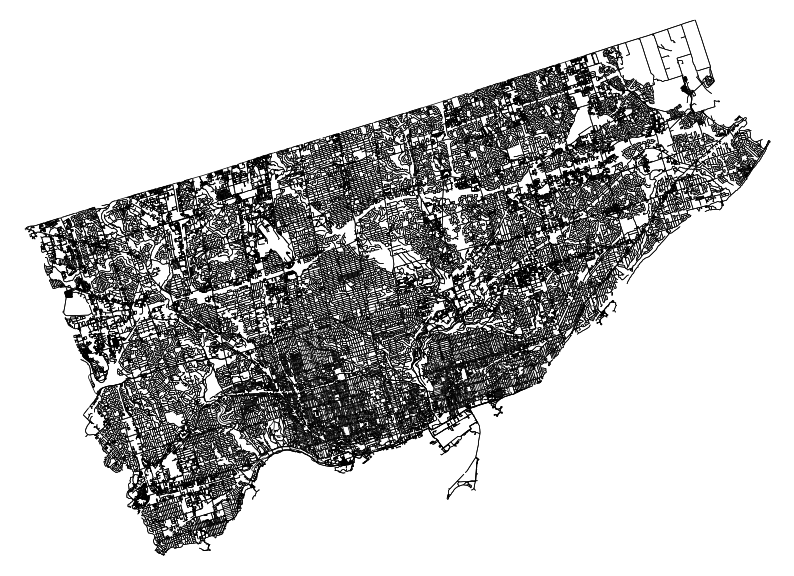

In [ ]:
ox.plot_graph(street_map, figsize=(10, 10), bgcolor='w',node_size=1, node_alpha=0,
              edge_linewidth=0.5, edge_color='k') #show edge only, change node_alpha to 0
plt.show()

### Show Nodes (Intersections) Only

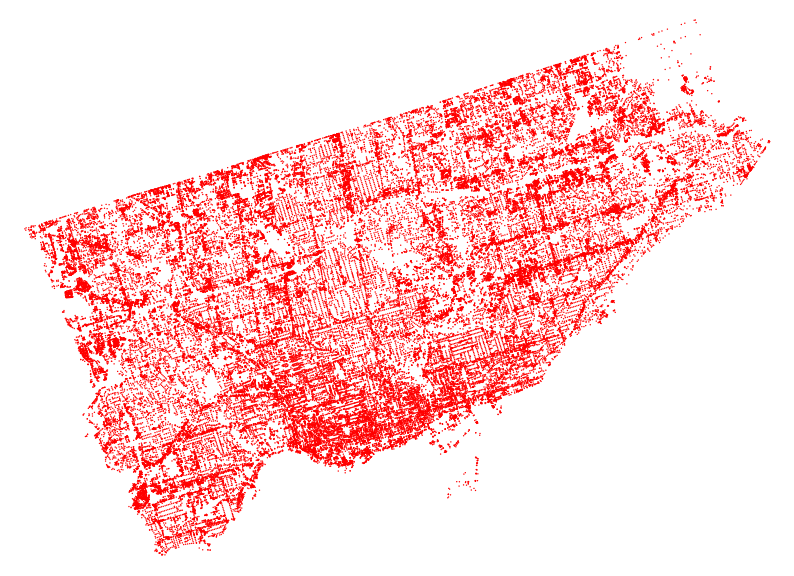

In [ ]:
ox.plot_graph(street_map, figsize=(10, 10), bgcolor='w',node_size=1, node_alpha=1, node_color='r',
              edge_linewidth=0.5, edge_alpha=0) #show node only, change the edge_alpha to 0
plt.show()

### Show Both Nodes and Edges

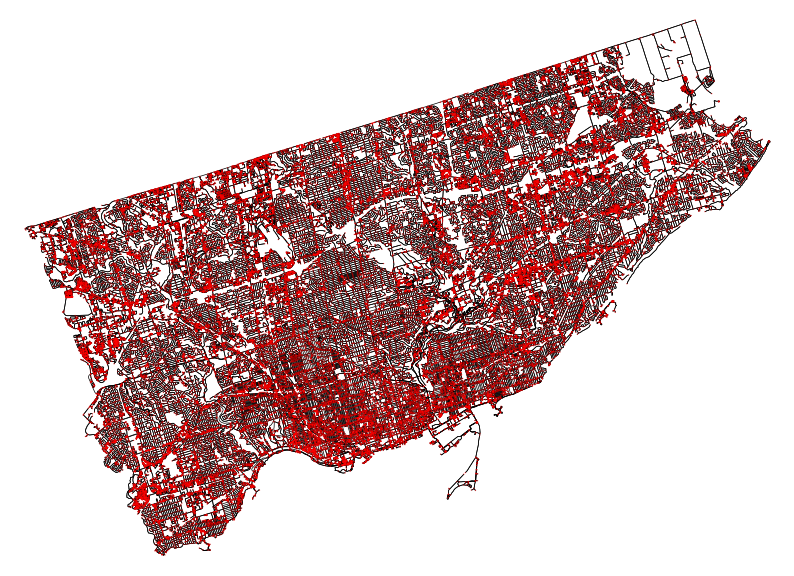

In [ ]:
ox.plot_graph(street_map, figsize=(10, 10), bgcolor='w',node_size=1, node_alpha=0.5, node_color='r',
              edge_linewidth=0.5, edge_color='k') #show edge only
plt.show()

If we zoom in on the map, all the edges and nodes become clearly visible. These are bike accessible route extracted using `osmnx` website

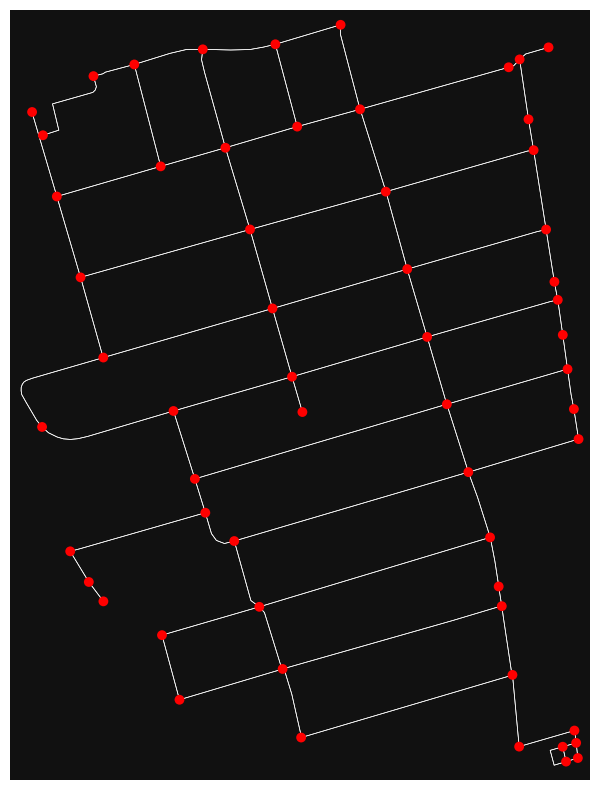

In [ ]:
ox.plot_graph(ox.graph_from_bbox(bbox = [43.71, 43.72, -79.41, -79.40], network_type='bike'), # get the bike network within the boundary
              figsize=(10, 10),node_size=50, node_alpha=1, node_color='r',
              edge_linewidth=0.5, edge_color='w')
plt.show()

The graph is under the same CRS as our previous points and polygons

In [ ]:
street_map.graph['crs']

'epsg:4326'

In [ ]:
print('Number of nodes:', street_map.number_of_nodes()) # print the number of nodes
print('Number of edges:', street_map.number_of_edges()) # print the number of edges

Number of nodes: 85253
Number of edges: 223457


### Finding the Shortest Bike Accessible Distance

Let's explore an example of finding the shortest bike accessible distance between a FSA centroid and a TTC subway station

In [ ]:
FSA_name = 'M1B'
fsa = fsa_centroid[fsa_centroid['name'] == FSA_name]['centroid'].values[0]
fsa_coords = (fsa.x, fsa.y)

Station_name = 'Kennedy'
subway_station = subway_station_centroid[subway_station_centroid['name'] == Station_name]['centroid'].values[0]
subway_station_coords = (subway_station.x, subway_station.y)

print('FSA name:', FSA_name, 'FSA centroid:', fsa_coords)
print('Subway station name:', Station_name, 'Subway station centroid:', subway_station_coords)

FSA name: M1B FSA centroid: (-79.19169672198504, 43.818617243695904)
Subway station name: Kennedy Subway station centroid: (-79.2637167, 43.7324439)


Not every coordinate is within the nodes of the bike accessible path graph. Therefore, we need to find the node that is closest to the centroid of the FSA and the station.

In [ ]:
FSA_node = ox.distance.nearest_nodes(street_map, fsa_coords[0], fsa_coords[1]) #will return the nearest node ID in the graph
subway_station_node = ox.distance.nearest_nodes(street_map, subway_station_coords[0], subway_station_coords[1])

print('Actual FSA coordinates:', fsa_coords, 'Nearest node ID:', FSA_node, 'Nearest node coordinates:',
      street_map.nodes[FSA_node]['x'], street_map.nodes[FSA_node]['y'])
print('Actual Subway Station coordinates:', subway_station_coords, 'Nearest node:', subway_station_node, 'Nearest node coordinates:',
       street_map.nodes[subway_station_node]['x'], street_map.nodes[subway_station_node]['y'])


Actual FSA coordinates: (-79.19169672198504, 43.818617243695904) Nearest node ID: 364148281 Nearest node coordinates: -79.1991944 43.8186561
Actual Subway Station coordinates: (-79.2637167, 43.7324439) Nearest node: 1430440695 Nearest node coordinates: -79.2645857 43.7327854


To find the shorest bike accessible path, we need `networkx` package

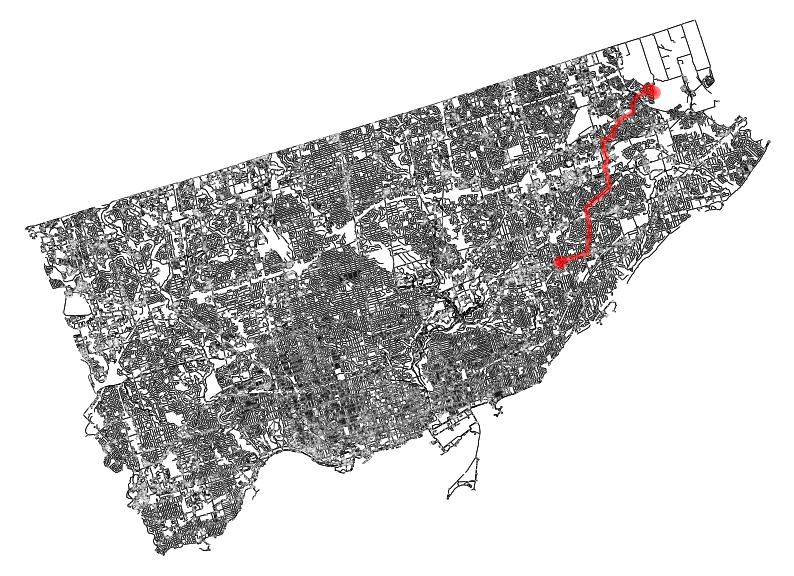

In [ ]:
import networkx as nx
# you dont need to convert the graph to networkx graph, you can directly use the graph from osmnx
shortest_path = nx.shortest_path(street_map, FSA_node , subway_station_node, weight='length')
ox.plot_graph_route(street_map, shortest_path,figsize=(10, 10), bgcolor='w',node_size=1, node_alpha=0.3,
              edge_linewidth=0.5, edge_color='k')
plt.show()

we can also find the distance of this shortest bike accessible path

In [ ]:
distance = nx.shortest_path_length(street_map, FSA_node , subway_station_node, weight='length')
print('The shortest path length between FSA and subway station is:', distance)

The shortest path length between FSA and subway station is: 14594.148999999994


Let us combine all the codes in this example to create a function that will return the shortest bike accessible distance between two locations

In [ ]:
def distance_of_shortest_path(graph, fsa_name, subway_station_name, fsa_centroid, subway_station_centroid) -> float:

    '''
    This function will calculate the shortest path length between a FSA and a subway station

    Args:
    graph: the graph object of the route map
    fsa_name: the name of the FSA
    subway_station_name: the name of the subway station
    fsa_centroid: a dataframe of the centroid of all FSA
    subway_station_centroid: a dataframe of the centroid of all subway station

    Returns:
    distance: the shortest path length
    '''

    fsa = fsa_centroid[fsa_centroid['name'] == fsa_name]['centroid'].values[0] #get the centroid of the FSA by given name
    fsa_coords = (fsa.x, fsa.y) #get the coordinates of the centroid
    subway_station = subway_station_centroid[subway_station_centroid['name'] == subway_station_name]['centroid'].values[0] #get the centroid of the subway station by given name
    subway_station_coords = (subway_station.x, subway_station.y) #get the coordinates of the centroid
    fsa_node = ox.distance.nearest_nodes(graph, fsa_coords[0], fsa_coords[1]) #get the nearest node ID in the graph
    subway_station_node = ox.distance.nearest_nodes(graph, subway_station_coords[0], subway_station_coords[1]) #get the nearest node ID in the graph
    distance = nx.shortest_path_length(graph, fsa_node , subway_station_node, weight='length') #calculate the shortest path length
    route = nx.shortest_path(graph, fsa_node , subway_station_node, weight='length') #get the route
    return distance, route #return the shortest path length and the route

distance, route  = distance_of_shortest_path(street_map, 'M1B', 'Dundas', fsa_centroid, subway_station_centroid)
distance

28331.457000000002

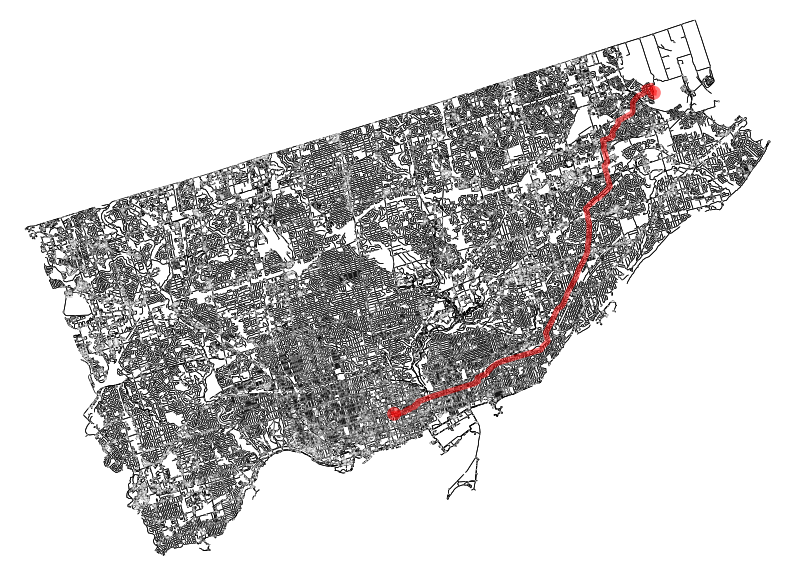

In [ ]:
ox.plot_graph_route(street_map, route,figsize=(10, 10), bgcolor='w',node_size=1, node_alpha=0.3,
              edge_linewidth=0.5, edge_color='k')
plt.show()

### Geo-Coding with Street Map
We can utilize geo-coding to find any shortest bike accessible path between two addresses

In [75]:
warnings.filterwarnings("ignore")

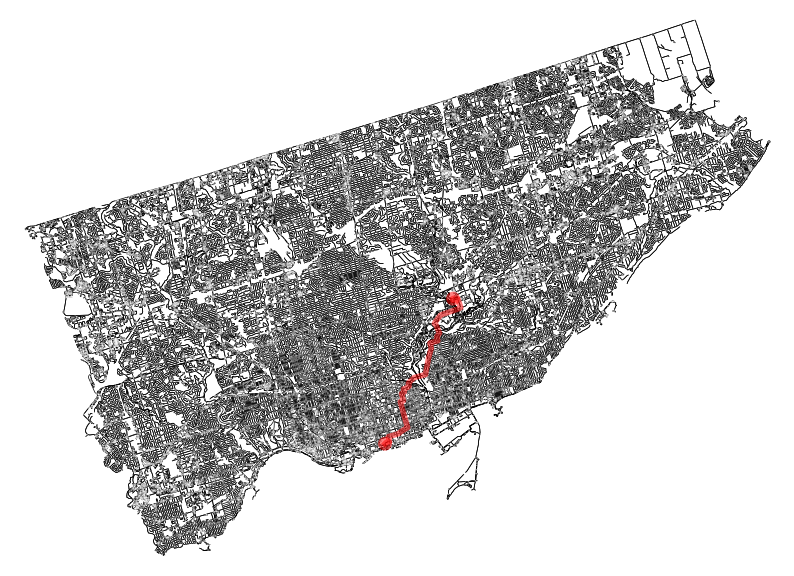

In [76]:
from geopy.geocoders import Nominatim

address1 = '290 Bremner Blvd, Toronto, ON M5V 3L9'
address2 = '770 Don Mills Rd., North York, ON M3C 1T3'

geolocator = Nominatim(user_agent="my_app")
location1 = geolocator.geocode(address1)
location2 = geolocator.geocode(address2)
location1_node = ox.distance.nearest_nodes(street_map, location1.longitude, location1.latitude)
location2_node = ox.distance.nearest_nodes(street_map, location2.longitude, location2.latitude)
shortest_path = nx.shortest_path(street_map, location1_node, location2_node, weight='length')
ox.plot_graph_route(street_map, shortest_path,figsize=(10, 10), bgcolor='w',node_size=1, node_alpha=0.3,
              edge_linewidth=0.5, edge_color='k')
plt.show()


### Distance Matrix Using Shortest Bike Accessible Paths

We can also calculate the distance matrix using this function (Please note that it takes much longer to run than the previous geometric distance method)

In [ ]:
def get_distance_matrix_by_shortest_path(fsa_centroid, subway_station_centroid, graph) -> pd.DataFrame:
    '''
    this function is used to calculate the distance matrix between each FSA and subway station using the shortest path

    graph: the graph object of the route map
    fsa_centroid: dataframe with the centroid of FSA
    subway_station_centroid: dataframe with  the centroid of subway station

    return: a dataframe with the distance between each FSA and subway station
    '''
    # too increase the speed, we will first get the node id of each centroid
    fsa_node_id = [ox.distance.nearest_nodes(graph, centroid.x, centroid.y) for centroid in fsa_centroid['centroid'].to_list()]
    subway_station_node_id = [ox.distance.nearest_nodes(graph, centroid.x, centroid.y) for centroid in subway_station_centroid['centroid'].to_list()]

    # then we will calculate the shortest path length between each FSA and subway station
    distance_matrix = np.zeros((fsa_centroid.shape[0], subway_station_centroid.shape[0]))
    for i in range(fsa_centroid.shape[0]):
        for j in range(subway_station_centroid.shape[0]):
            distance_matrix[i, j] = nx.shortest_path_length(graph, fsa_node_id[i], subway_station_node_id[j], weight='length')
    distance_matrix = pd.DataFrame(distance_matrix, index=fsa_centroid['name'].to_list(), columns=subway_station_centroid['name'])
    return distance_matrix

distance_matrix_by_shortest_path = get_distance_matrix_by_shortest_path(fsa_centroid, subway_station_centroid, street_map)


In [ ]:
distance_matrix_by_shortest_path.head()

name,Bathurst,Bay,Dundas West,St. Patrick,Dundas,Main Street,Pape,Coxwell,Woodbine,St. George,...,Pioneer Village,York University,Royal York,Islington,Lansdowne,Dufferin,Ossington,Warden,Victoria Park,Chester
M1P,19211.686,17488.198,22966.637,19022.349,18422.174,10611.435,13867.347,12243.769,11371.644,18137.775,...,24537.304,23031.376,27650.396,28765.442,21877.964,21227.164,20415.325,7459.529,9436.162,14465.683
M1R,15946.058,14222.570,19701.009,15756.721,15156.546,7804.330,10601.719,8983.964,8106.016,14872.147,...,22819.469,21313.541,24171.529,25286.575,18612.336,17961.536,17149.697,4628.651,7096.135,11200.055
M6C,3927.598,5276.148,6237.692,6752.949,7084.589,12716.147,9021.548,10890.615,11706.873,4834.589,...,15097.076,13591.148,10199.254,11314.300,5194.791,4639.396,3863.045,14300.692,14009.015,8425.156
M6E,5301.083,6712.523,5013.669,8189.324,8520.964,14152.522,10457.923,12326.990,13143.248,6270.601,...,13753.029,12247.101,8888.969,10004.015,4005.486,3660.958,4384.214,16334.358,15509.320,9861.531
M6G,1095.593,2878.828,3719.004,4136.760,4740.956,10569.589,6874.990,8744.057,9560.315,2392.311,...,17587.804,16081.876,8445.747,9800.070,2630.331,1979.531,1083.577,14239.096,11926.387,6278.598
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
M4V,3282.721,2820.743,6957.888,4297.544,4629.184,10260.742,6566.143,8435.210,9251.468,2801.936,...,17186.230,15680.302,10928.788,12043.834,5896.604,5337.469,4488.534,12283.558,11617.540,5969.751
M5P,4092.736,3967.315,7747.463,5444.116,5775.756,11069.738,7701.344,9568.513,10180.715,3680.645,...,15681.548,14175.620,11711.205,12826.251,6686.179,6127.044,5298.549,12383.517,12091.840,7104.952
M5R,1685.516,1496.100,5527.702,2840.957,3445.153,9097.681,5403.082,7272.149,8088.407,1022.655,...,18366.087,16860.159,10254.445,11608.768,4439.029,3788.229,2894.632,12767.188,10454.479,4806.690
M5S,1504.230,1359.453,5259.181,1556.720,2162.850,8984.244,5289.645,7158.712,7974.970,863.684,...,19688.125,18182.197,9985.924,11340.247,4170.508,3519.708,2707.869,12653.751,10341.042,4693.253


we can show the shortest bike accessible path to the nearest station by combining the distance matrix, with the `distance_of_shortest_path` function

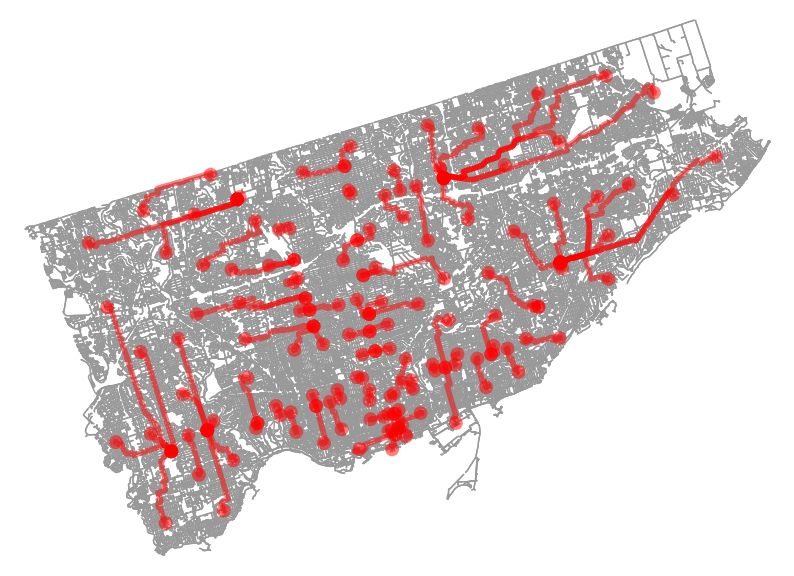

In [ ]:
# column name for min of each row
min_distance_column = distance_matrix_by_shortest_path.idxmin(axis=1)
route_lst = []
for index in min_distance_column.index:
    distance, route = distance_of_shortest_path(street_map, index, min_distance_column[index], fsa_centroid, subway_station_centroid)
    route_lst.append(route)

ox.plot_graph_routes(street_map, route_lst, route_linewidth=3,
                     node_size=0,figsize=(10, 10), bgcolor='w')
plt.show()

We can update the choropleth using this new distance matrix

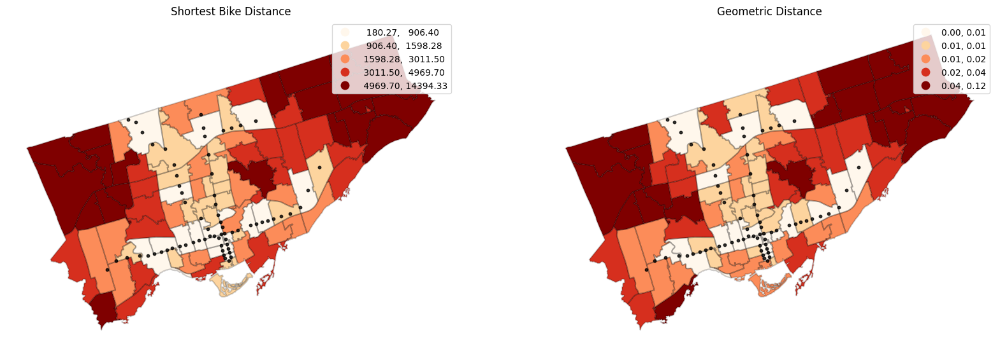

In [ ]:
fig, ax = plt.subplots(1,2, figsize=(20, 10))

smallest_distance = distance_matrix.min(axis=1)
# assign the name of the series for future merging
smallest_distance.name = 'distance_to_nearest_subway_station'
# obtain all row that is a foward sortation area
gdf_FSA = gdf_all[gdf_all_with_centroid['property_type'] == 'FSA']
# merge the distance series with the FSA shape data
gdf_smallest_distance = gdf_FSA.merge(smallest_distance, left_on='name', right_index=True).rename(columns={0: 'distance_to_nearest_subway_station'})

gdf_smallest_distance.plot(column='distance_to_nearest_subway_station', legend=True, scheme='quantiles',
              cmap='OrRd', figsize=(10, 10),ax=ax[1])
gdf_smallest_distance.boundary.plot(figsize=(10, 10), color = 'black',alpha=0.2,ax = ax[1])
# add subway station
gdf_all[gdf_all['property_type'] == 'subway_station'].plot(ax = ax[1], color='black', alpha=0.8, markersize=10)
ax[1].set_title('Geometric Distance')
ax[1].axis('off')


smallest_distance = distance_matrix_by_shortest_path.min(axis=1)
# assign the name of the series for future merging
smallest_distance.name = 'distance_to_nearest_subway_station'
# obtain all row that is a foward sortation area
gdf_FSA = gdf_all[gdf_all_with_centroid['property_type'] == 'FSA']
# merge the distance series with the FSA shape data
gdf_smallest_distance = gdf_FSA.merge(smallest_distance, left_on='name', right_index=True).rename(columns={0: 'distance_to_nearest_subway_station'})

gdf_smallest_distance.plot(column='distance_to_nearest_subway_station', legend=True, scheme='quantiles',
              cmap='OrRd', figsize=(10, 10),ax=ax[0])
gdf_smallest_distance.boundary.plot(figsize=(10, 10), color = 'black',alpha=0.2,ax = ax[0])
# add subway station
gdf_all[gdf_all['property_type'] == 'subway_station'].plot(ax = ax[0], color='black', alpha=0.8, markersize=10)
ax[0].set_title('Shortest Bike Accessible Distance')
ax[0].axis('off')

plt.show()

Lets create a folium map using this new choropleth

In [ ]:
shortest_distance_nearest_ttc_map = fm.Map(location=[43.7, -79.4], zoom_start=12,
                                  scrollWheelZoom=False,control_scale=True)
fm.TileLayer('cartodb dark_matter',show=False).add_to(shortest_distance_nearest_ttc_map) # add the dark matter tile layer, show=False means the layer is not shown by default
fm.TileLayer('cartodb positron',show=False).add_to(shortest_distance_nearest_ttc_map) # add the positron tile layer

quantile = gdf_smallest_distance['distance_to_nearest_subway_station'].quantile([0, 0.25, 0.5, 0.75, 1]).to_list()

# neartest subway station layer
fm.Choropleth(
    geo_data=FSA_json,
    name='Distance to the Nearest Subway Station',
    data=gdf_smallest_distance,
    columns=['name', 'distance_to_nearest_subway_station'],
    key_on='feature.properties.name',
    fill_color='OrRd',
    fill_opacity=0.4,
    line_opacity=0.2,
    bins = quantile,
    legend_name='Distance to the Nearest Subway Station'
).add_to(shortest_distance_nearest_ttc_map)

# station layer
station = fm.FeatureGroup(name="TTC Station", control=True).add_to(shortest_distance_nearest_ttc_map)
for i, row in subway_station_centroid.iterrows():
    fm.Marker([row['centroid'].y, row['centroid'].x],
              popup=row['name'],
              icon=fm.Icon(color='black', icon='train', prefix='fa')
             ).add_to(station)

# median income layer
median_income = fm.FeatureGroup(name="Median Income", control=True).add_to(shortest_distance_nearest_ttc_map)
for index, row in census_data_with_centroid.iterrows():
    centroid = [row['centroid'].y, row['centroid'].x]
    fm.CircleMarker(centroid, radius=row['median_income']*20, color='blue',
     fill=True, fill_color='blue').add_to(median_income)

#we also overlay the bike network
# bike route layer
street_json = ox.graph_to_gdfs(street_map, nodes=False).to_json() #we only need the edge data
fm.GeoJson(street_json, name='Bike Network', style_function=lambda x: {'color': 'black', 'weight': 1.5, 'opacity':0.2}).add_to(shortest_distance_nearest_ttc_map)

#and overlay the shortest path\
# shortest path layer
short_path_feature = fm.FeatureGroup(name="Shortest Path to Nearest Station", control=True).add_to(shortest_distance_nearest_ttc_map)
for route in route_lst:
    route_json = ox.utils_graph.route_to_gdf(street_map,route).to_json()
    fm.GeoJson(route_json, name='Shortest Path to Nearest Station', style_function=lambda x: {'color': 'red', 'weight': 5, 'opacity':0.8}).add_to(short_path_feature)

# layer countrol
fm.LayerControl().add_to(shortest_distance_nearest_ttc_map)
shortest_distance_nearest_ttc_map


## Raster Data (OPTIONAL)

Raster data models use a grid of cells, also known as pixels, to represent real-world objects. These data models are often used to represent and manage a variety of entities such as imagery, surface temperatures, digital elevation models, and more.

You can think of a raster as a specific instance of an area object, divided into a regular grid of cells. A more fitting analogy, perhaps, would be to compare rasters to a regularly spaced array of marked points, as rasters are usually stored as an array of values in most GIS environments. Each cell within this array is defined by a unique pair of coordinates.

A crucial feature of raster data models is that each cell or pixel has an associated value. This stands in contrast to vector models where the geometric primitive may or may not have an associated value.

![](https://pygis.io/_images/vector_vs_raster.jpg)

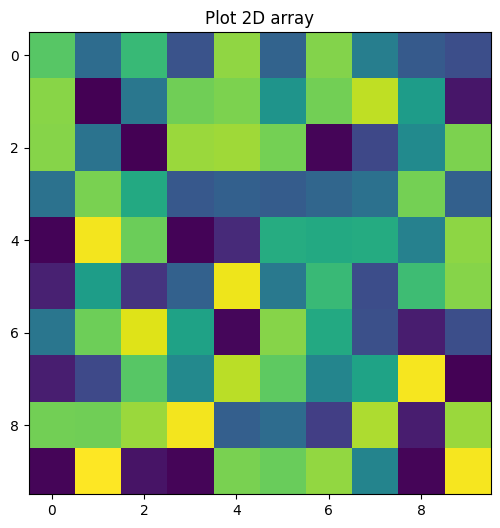

In [77]:
X=np.random.randint(256, size=(10, 10))

fig = plt.figure(figsize=(8,6))
plt.imshow(X)
plt.title("Plot 2D array")
plt.show()

For a more practical example, we can use the library `rioxarray` to handle geospatial raster data. `rioxarray` reads and writes geospatial raster datasets, making it an essential tool for raster analysis.

In [1]:
!pip install rioxarray
import rioxarray as rxr

### Average Surface Temperature in July 2, 2020 (degrees Celsius) in Ontario

The most commonly used format for raster data is `GeoTIFF`, based on the Tag Image File Format (TIFF) format (`.tif`). GeoTIFF serves as an interchange format for georeferenced raster imagery. A key advantage of the TIFF format is its lossless compression, ensuring that image quality remains intact. This attribute is particularly crucial for raster data, where each pixel represents real geographical information. Furthermore, GeoTIFF files allow for the inclusion of additional image information and data, such as multiple geographical layers, making them versatile for various applications. For further information about the TIFF format, refer to Adobe's documentation: [TIFF File Format](https://www.adobe.com/creativecloud/file-types/image/raster/tiff-file.html).

Locating sources of raster data can be challenging compared to finding CSV datasets or ShapeFiles. Much of this data originates from remote sensing images captured by weather stations or satellites. One renowned raster dataset is the NASA Landsat program, which comprises a series of Earth-observing satellite missions managed jointly by NASA and the U.S. Geological Survey (USGS). For instance, Landsat Collection 2 provides surface temperature data of the Earth obtained through satellite sensing. To explore Landsat data, utilize the web application available at [NASA LandsatLook](https://landsatlook.usgs.gov/explore). For additional information about the Landsat program, visit the official website: [NASA Landsat Program](https://landsat.gsfc.nasa.gov/data/).

There are also other data available, such as
-   https://data.giss.nasa.gov/gistemp/
-   https://modis.gsfc.nasa.gov/data/dataprod/mod11.php
-  https://developers.google.com/earth-engine/datasets
- https://developers.google.com/earth-engine/datasets/tags/temperature



Nevertheless, raw imagery data from sources like Landsat can be challenging for non-geologists to utilize directly. Many research groups specialize in converting such raw imagery data into usable data products, which they then publish for public access. One such repository is [ArcGIS](https://www.arcgis.com/home/search.html), which maintains a vast database of geographical data, including shapefiles, map layers, and raster data, freely available to the public. In this lab, we will be utilizing the Average Surface Temperature in July 2, 2020 (degrees Celsius) of dataset provided by the Toronto and Region Conservation Authority (TRCA) using Landsat 8 images. Detailed information about this raster data can be found at [TRCA ArcGIS](https://www.arcgis.com/home/item.html?id=f8e9f4ef6a2d4f03884f6a7c66642d0b).

ERROR 1: Line 22: </table> doesn't have matching <table>.


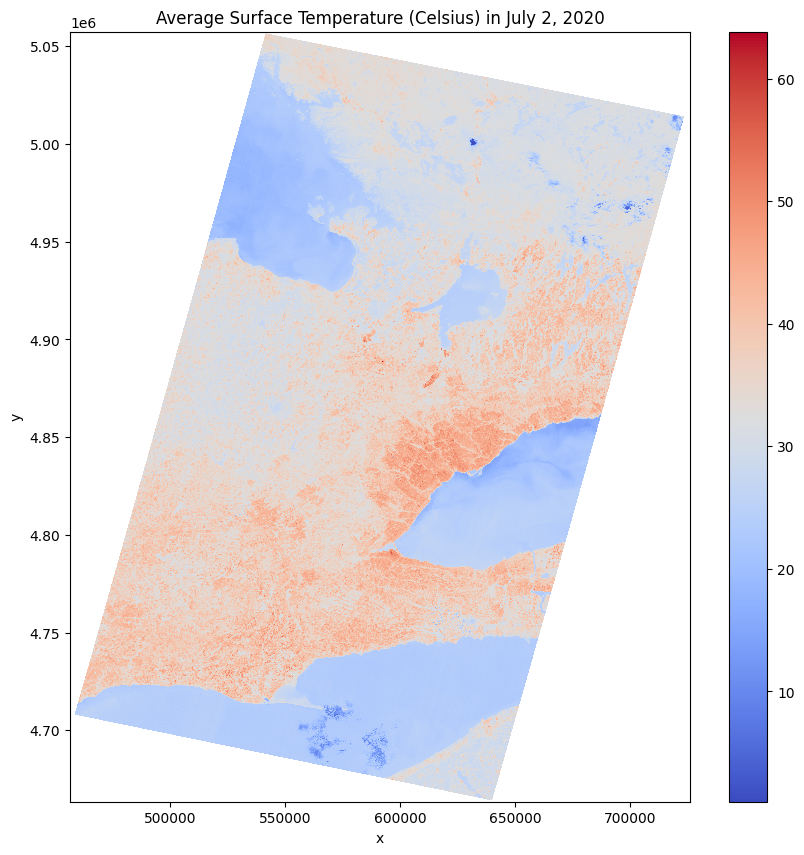

In [4]:
url = 'https://www.arcgis.com/sharing/rest/content/items/f8e9f4ef6a2d4f03884f6a7c66642d0b/data' # the url of the raster data

raster_data = rxr.open_rasterio(url,masked=True).squeeze() # open the raster data
fig, ax = plt.subplots(figsize=(10,10))
raster_data.plot.imshow(ax=ax, cmap='coolwarm', add_colorbar=True) # include the color bar
ax.set_title('Average Surface Temperature (Celsius) in July 2, 2020')
plt.show()

Note: Surface temperature, in this context, refers to the average temperature of the land surface in Celsius. It's important to note that this measurement may differ from the air temperature commonly referred to in weather reports. Additionally, the raw Landsat image may not be captured in our commonly used thermal infrared band, which could introduce bias in the conversion process to obtain surface temperature data.

you can examnine the shape of raster image using `.rio.shape` attribute

In [80]:
raster_data.rio.shape

(13134, 8986)

### Raster Coordinate Reference Systems (CRS)

Raster data differs significantly from vector data. One key distinction is that raster data doesn't have a pair of coordinates (x,y) for each pixel. So, how do we determine the location of a raster in addition to its data values? This presents a challenge when attempting to assign or project raster data onto a 2D map. If you're interested in delving into this topic further, here's a detailed tutorial: [link to tutorial](https://pygis.io/docs/d_raster_crs_intro.html).

But rioxarray pacakge can handle all of these for us

In [9]:
print('CRS of the raster data:', raster_data.rio.crs)
raster_data = raster_data.rio.reproject(toronto_FSA.crs)
print('CRS of the raster data:', raster_data.rio.crs)

CRS of the raster data: EPSG:32617
CRS of the raster data: EPSG:4326


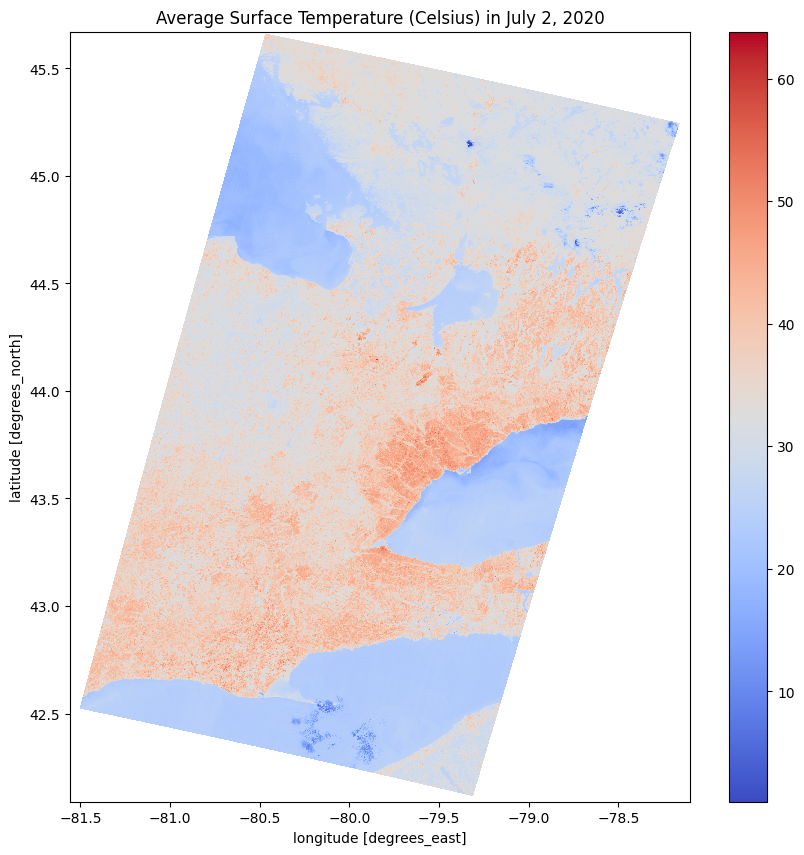

In [10]:
fig, ax = plt.subplots(figsize=(10,10))
raster_data.plot.imshow(ax=ax, cmap='coolwarm', add_colorbar=True) # include the color bar
ax.set_title('Average Surface Temperature (Celsius) in July 2, 2020')
plt.show()

Another issue arises from the fact that we require only the raster data for the city of Toronto, rather than the entirety of Southern Ontario.

We can create mask of shapefiles using `mapping` function, and using this map to crop the data using `rio.clip` function

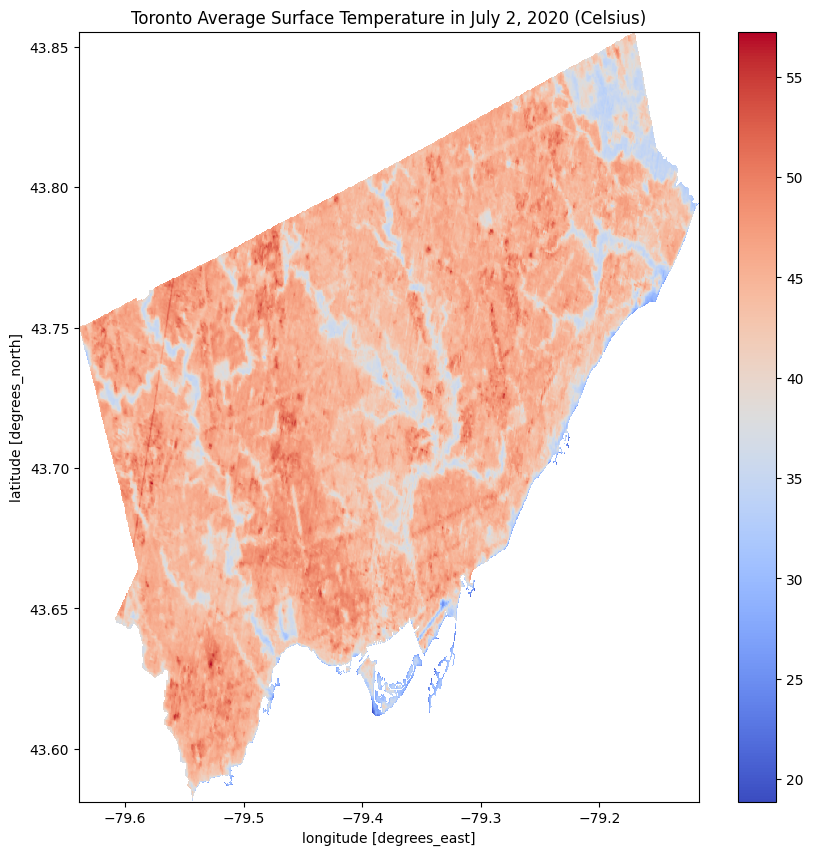

In [15]:
from shapely.geometry import mapping
raster_data_clipped = raster_data.rio.clip(toronto_FSA.geometry.apply(mapping))
raster_data_clipped.plot.imshow(cmap='coolwarm', figsize=(10, 10))
plt.title('Toronto Average Surface Temperature in July 2, 2020 (Celsius)')
plt.show()

Once the CRS of the raster data matches that of the Toronto FSA shapefiles we had previously, we can combine these two maps into a single plot.

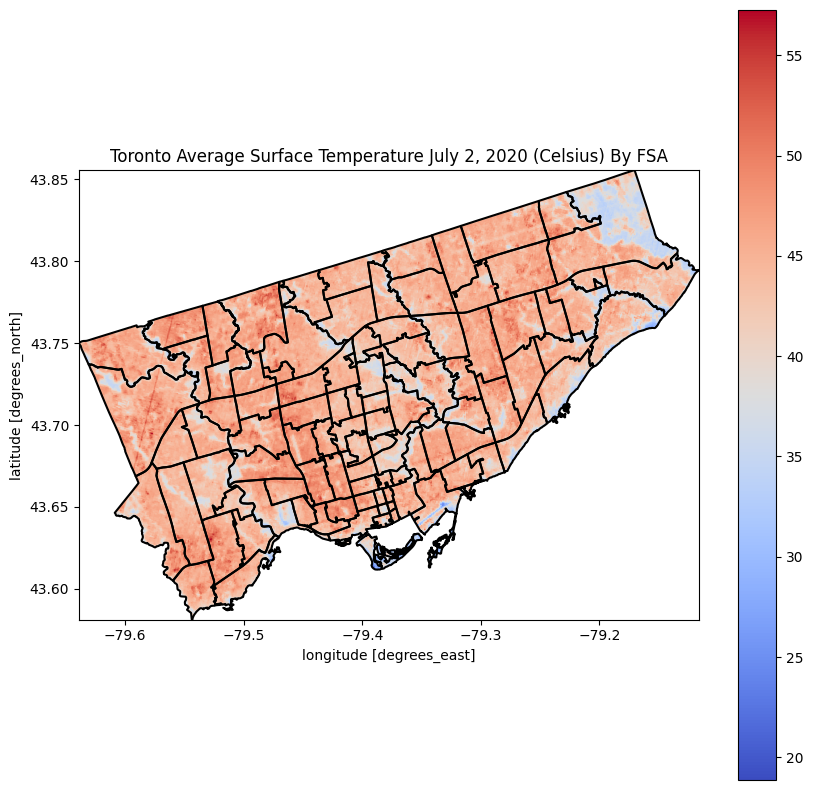

In [16]:
fig, ax = plt.subplots(figsize=(10,10))
raster_data_clipped.plot.imshow(ax=ax, cmap='coolwarm')
toronto_FSA.boundary.plot(figsize=(10, 10), color = 'black', ax=ax, alpha=1)
plt.title('Toronto Average Surface Temperature July 2, 2020 (Celsius) By FSA')
plt.show()

### Zonal Statistics: Summarizing Raster Data By FSA Vector Shapes

`rasterstats` package can extract information from geospatial raster data based on vector geometries. Primarily, this involves zonal statistics: a method of summarizing and aggregating the raster values intersecting a vector geometry. In our example, zonal statistics provides answers such as the mean surface temperature of an FSA.

In [11]:
!pip install rasterstats
from rasterstats import zonal_stats

The `zonal_stats` function requires either a GeoDataFrame with corresponding shapes or a raw shapefile, along with the raster data's values. Additionally, it necessitates the coordinate information about the raster data, which can be obtained using the `.rio.transform()` function from the `rioxarray` library. This function provides the transformation matrix that maps pixel coordinates to geographic coordinates. Finally, the `stats` parameter specifies which aggregation function should be used to summarize the raster data within each zone defined by the shapefile or GeoDataFrame. Common aggregation functions include mean, median, sum, minimum, and maximum, among others.

In [17]:
stats = zonal_stats(toronto_FSA,raster_data_clipped.values,affine=raster_data_clipped.rio.transform(),stats=['mean'])

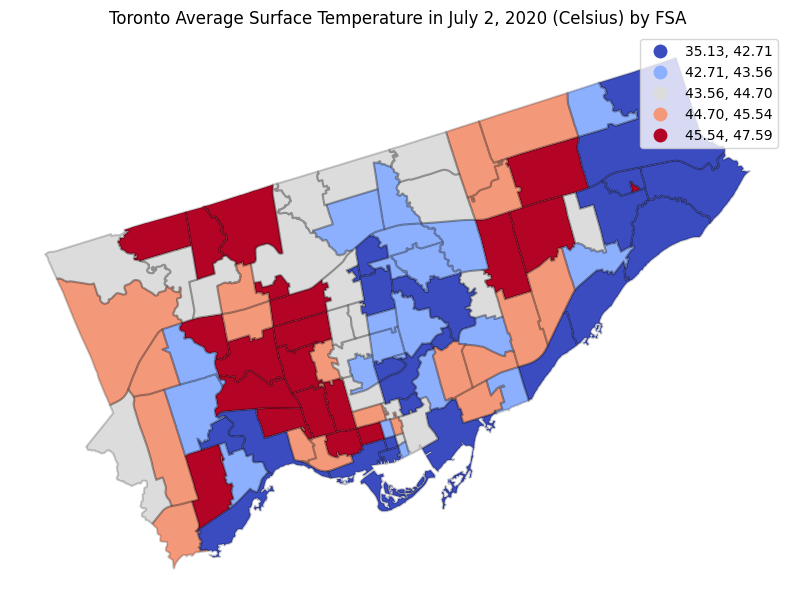

In [19]:
gdf_surface_tem = toronto_FSA.copy()
gdf_surface_tem ['mean_temperature'] = [x['mean'] for x in stats]
gdf_surface_tem.plot(column='mean_temperature', legend=True, scheme='quantiles', cmap='coolwarm', figsize=(10, 10))
gdf_surface_tem.boundary.plot(figsize=(10, 10), color = 'black', alpha=0.2, ax=plt.gca())
plt.title('Toronto Average Surface Temperature in July 2, 2020 (Celsius) by FSA')
plt.axis('off')
plt.show()

In [88]:
# folium map
surface_tem_map = fm.Map(location=[43.7, -79.4], zoom_start=11.5,
                          control_scale=True, scrollWheelZoom=False)
fm.Choropleth(
    geo_data=FSA_json,
    name='Average Surface Temperature (Celsius) in July 2, 2020 (Celsius)',
    data=gdf_surface_tem,
    columns=['name', 'mean_temperature'],
    key_on='feature.properties.name',
    fill_color='OrRd',
    fill_opacity=0.4,
    line_opacity=0.4,
    legend_name='Average Surface Temperature in July 2, 2020 (Celsius)'
).add_to(surface_tem_map)
surface_tem_map

- Which parts of cities tend to have the highest average surface temperature in July 2, 2020 (Celsius) ? Which parts have the lowest?

- Why some FSA in Downtown Toronto near Lake Ontario tend to have lower temperature than some other areas?

## Classifying Raster Data

Sometimes, we may not have a list of Forward Sortation Areas (FSAs) or any vector shapes to summarize different areas of raster data by zones. In such cases, can we categorize raster data solely based on certain metrics obtained from the data itself?

![Reclass Raster](https://www.earthdatascience.org/images/earth-analytics/raster-data/reclass-raster-esri.gif)

We can classify averages by quantiles or by any hypothesis we wish to test.

### Classifying By Quantiles

We can define several classes based on the range of raster data's percentiles (similar to the different color schemes seen in choropleth maps). For example, we can define four classes:

- Class 1: pixels' values within 0% to 25% percentiles
- Class 2: within 25% to 80% percentiles
- Class 3: within 80% to 100% percentiles
- Class 4: greater than 100% percentiles

Then we can assign each pixel's value as its class label.

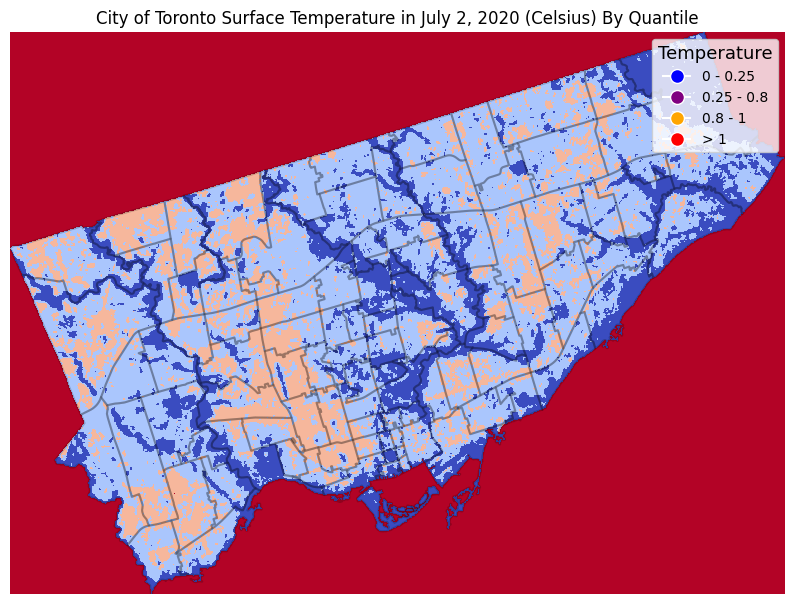

In [20]:
import xarray as xr # helper package to classify the raster data
raster_data_clipped_classified = xr.apply_ufunc(np.digitize, raster_data_clipped,
raster_data_clipped.quantile([0, 0.25, 0.8, 1]).values) #classify the data using given quantile boundary 0 - 0.25, 0.25-0.8, 0.8 - 1, and > 1
fig, ax = plt.subplots(figsize=(10,10))
raster_data_clipped_classified.plot.imshow(ax=ax, cmap='coolwarm', add_colorbar = False)
toronto_FSA.boundary.plot(figsize=(10, 10), color = 'black', ax=ax, alpha=0.2)

# in default, legend in rasterdata is a color bar for continuous data, we will create a custom legend
from matplotlib.lines import Line2D
colors = ['blue', 'purple', 'orange', 'red']
legend_handles = [Line2D([0], [0], marker='o', color='w', label='0 - 0.25', markerfacecolor=colors[0], markersize=10),
                  Line2D([0], [0], marker='o', color='w', label='0.25 - 0.8', markerfacecolor=colors[1], markersize=10),
                  Line2D([0], [0], marker='o', color='w', label='0.8 - 1', markerfacecolor=colors[2], markersize=10),
                  Line2D([0], [0], marker='o', color='w', label='> 1', markerfacecolor=colors[3], markersize=10)]

plt.legend(handles=legend_handles, title='Temperature', title_fontsize='13', loc='upper right')
plt.title('City of Toronto Surface Temperature in July 2, 2020 (Celsius) By Quantile')
plt.axis('off')
plt.show()

The highest value are background (more than 100% precentile), which is bad for our visualization. We can re-map all class 4: background into a new lowest fake class -1

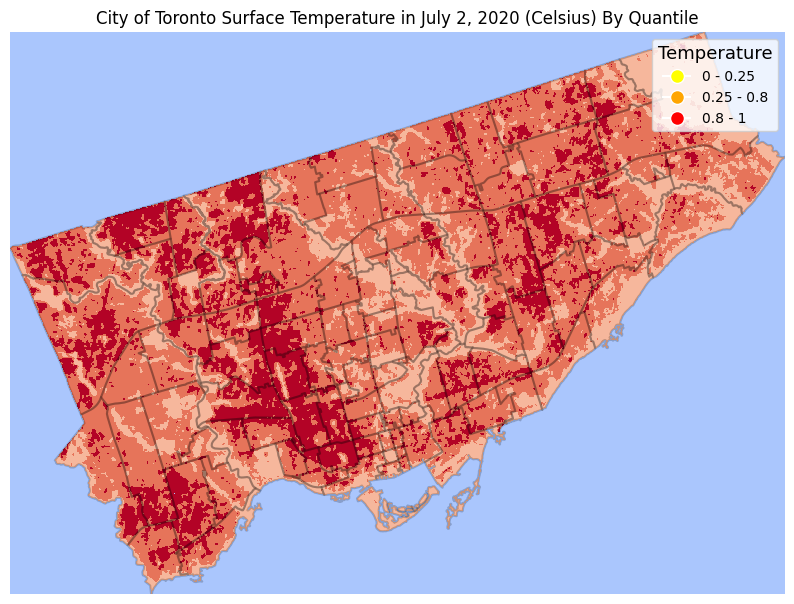

In [21]:
raster_data_clipped_classified = raster_data_clipped_classified.where(raster_data_clipped_classified != 4, -1) # re-map the bakcground to -1, instead of highest
fig, ax = plt.subplots(figsize=(10,10))
raster_data_clipped_classified.plot.imshow(ax=ax, cmap='coolwarm', add_colorbar = False)
toronto_FSA.boundary.plot(figsize=(10, 10), color = 'black', ax=ax, alpha=0.2)

# in default, legend in rasterdata is a color bar for continuous data, we will create a custom legend
from matplotlib.lines import Line2D
colors = ['yellow', 'orange', 'red']# based on the color of the classified data in the plot
legend_handles = [Line2D([0], [0], marker='o', color='w', label='0 - 0.25', markerfacecolor=colors[0], markersize=10),
                  Line2D([0], [0], marker='o', color='w', label='0.25 - 0.8', markerfacecolor=colors[1], markersize=10),
                  Line2D([0], [0], marker='o', color='w', label='0.8 - 1', markerfacecolor=colors[2], markersize=10)]

plt.legend(handles=legend_handles, title='Temperature', title_fontsize='13', loc='upper right')
plt.title('City of Toronto Surface Temperature in July 2, 2020 (Celsius) By Quantile')
plt.axis('off')
plt.show()

By classifying map into five different class based on quantile, we can see a more distinguishable difference in temperature between each parts of city. By specifying different boundary or quantile, we can hightlight specific parts of cities based on their temperature.

### Binary Classification: Higher Than or Lower Than

In a more extreme case, we can classify raster data into two classes as black and white image. For example, we can classify based on whether the temperature higher than 0.85 precentile. This appoarch allows to hightlight areas of the city based on a thershold.

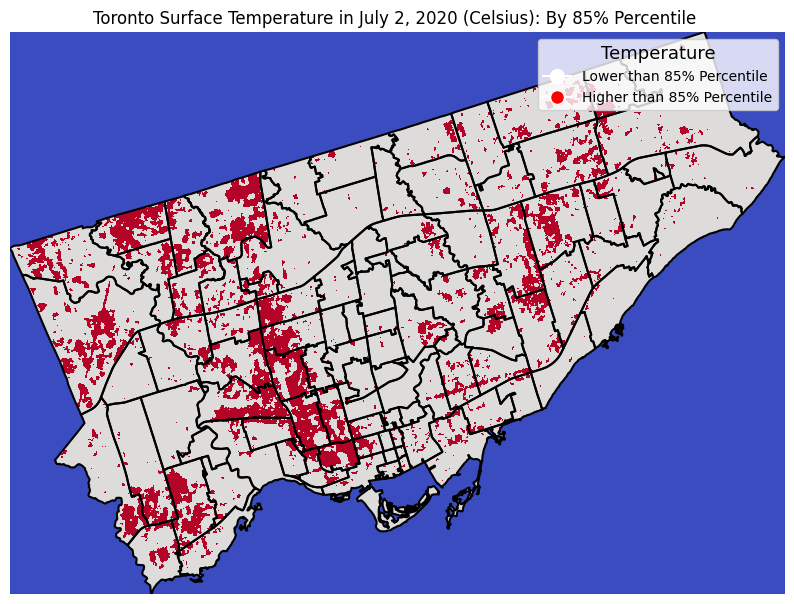

In [25]:
raster_data_clipped_classified = xr.apply_ufunc(np.digitize, raster_data_clipped, raster_data_clipped.quantile([0.85, 1]).values) #classify the data
# again, we need to clipped the background into a fake class
raster_data_clipped_classified = raster_data_clipped_classified.where(raster_data_clipped_classified != 2, -1)
fig, ax = plt.subplots(figsize=(10,10))
raster_data_clipped_classified.plot.imshow(ax=ax, cmap='coolwarm',add_colorbar=False)
toronto_FSA.boundary.plot(figsize=(10, 10), color = 'black', ax=ax, alpha=1)
plt.title('Toronto Surface Temperature in July 2, 2020 (Celsius): By 85% Percentile')
plt.axis('off')

#we can create a custom legend
legend_handles = [Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10,
                         label=['Lower than 85% Percentile','Higher than 85% Percentile'][i]) for i, color in enumerate(['white', 'red'])]
plt.legend(handles=legend_handles, title='Temperature', title_fontsize='13', loc='upper right')

plt.show()